> Imports, Helper Functions, and Plot Functions

In [1]:
import requests
import json
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
from scipy.stats import probplot, shapiro
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.arima.model import ARIMA
from arch import arch_model

In [2]:
def save_or_load(fpath, mode, variable=None):
    '''
        Helper function for save or load a variable into/from a file.
    '''
    with open(fpath, mode) as file:
        if mode == 'wb': pickle.dump(variable, file)
        elif mode == 'rb': return pickle.load(file)

In [3]:
# load
tsdf = save_or_load('tsdata.pkl', 'rb')           # price series
lrdf = save_or_load('lrdfdata.pkl', 'rb')         # log returns
# voldf = save_or_load('voldfdata.pkl', 'rb')       # old volatility
voldf = save_or_load('newvoldfdata.pkl', 'rb')    # new volatility

In [4]:
# log(volatility)
logvoldf = {freq: df.apply(np.log).replace(-np.inf, np.nan).dropna() for freq, df in voldf.items()}

In [5]:
# constants
COLORS = ['#636EFA', '#EF553B', '#00CC96']
COLORSMAP = {'nobitex': '#636EFA', 'tabdeal': '#EF553B', 'implied': '#00CC96'}

In [6]:
def freqs_buttons_maker(dictdf, n_traces_in_page, variable_name):
    '''
        Buttons maker for different frequencies.
    '''
    buttons = []
    for i, freq in enumerate(dictdf.keys()):
        visibility = [False] * n_traces_in_page *  len(dictdf)
        for j in range(n_traces_in_page):
            visibility[i * n_traces_in_page + j] = True
        button = dict(
            label=f'{freq} min',
            method='update',
            args=[{'visible': visibility},
                  {'title': f'{variable_name} at {freq} min Frequency'}]
        )
        buttons.append(button)

    return buttons

In [7]:
def plot_tsdf_like(tsdf, variable_name, xaxis_title='Date'):
    '''
        Plot variables with structures like tsdf (a dict of freq -> df with exchange columns)
        with a button to select frequency.
    '''
    fig = go.Figure()
    
    # create 3 traces for each exchange in each frequency but set them to visible=False initially
    for freq, df in tsdf.items():
        fig.add_trace(go.Scatter(x=df.index, y=df['nobitex'], mode='lines', name=f'Nobitex {freq} min', visible=False))
        fig.add_trace(go.Scatter(x=df.index, y=df['tabdeal'], mode='lines', name=f'Tabdeal {freq} min', visible=False))
        fig.add_trace(go.Scatter(x=df.index, y=df['implied'], mode='lines', name=f'Implied {freq} min', visible=False))
    
    # make a list of buttons for each frequency
    buttons = freqs_buttons_maker(tsdf, n_traces_in_page=3, variable_name=variable_name)
    
    # Add the dropdown menu representing buttons to the layout
    fig.update_layout(
        updatemenus=[{
            'buttons': buttons,
            'direction': 'down',
            'showactive': True,
        }],
        title='Select Frequency to View ' + variable_name,
        xaxis_title=xaxis_title,
        yaxis_title=variable_name,
    )
    
    # initially show the first frequency data
    for trace in fig.data[:3]:
        trace.visible = True
    
    fig.show()

In [8]:
def stats_buttons_maker(n_traces_in_page, variable_name):
    '''
        Buttons maker for below statistics.
    '''
    stats = ['mean', 'std', 'skewness', 'kurtosis']
    buttons = []
    for i, stat in enumerate(stats):
        visibility = [False] * n_traces_in_page *  len(stats)
        for j in range(n_traces_in_page):
            visibility[i * n_traces_in_page + j] = True
        button = dict(
            label=stat,
            method='update',
            args=[{'visible': visibility},
                  {'title': f'{stat} of {variable_name} in different time scales'}]
        )
        buttons.append(button)

    return buttons

In [9]:
from scipy.stats import skew, kurtosis

def plot_stats(lrdf, variable_name):
    '''
        Plot statistics (mean, std, skewness, kurtosis) to compare each statistics in timescales.
        There is a button to select statistics.
    '''
    fig = go.Figure()
    
    # function to create statistics dataframe, freqs as indecies and exchanges as columns
    freqs = sorted(lrdf, key=lambda key: int(key))
    def statsdf(statfunc):
        stats = [lrdf[freq].apply(statfunc) for freq in freqs]
        return pd.concat(stats, axis=1).rename(columns=dict(zip(range(len(freqs)), freqs))).T
    
    # add each stats for each exchange as a trace
    exchanges = ['nobitex', 'tabdeal', 'implied']
    funcs = [np.mean, np.std, skew, kurtosis]
    for statdf in [statsdf(func) for func in funcs]:
        for exchange in exchanges:
            fig.add_trace(go.Scatter(x=statdf.index, y=statdf[exchange], name=exchange, visible=False))
    
    # create buttons for stats and update layout
    buttons = stats_buttons_maker(n_traces_in_page=3, variable_name=variable_name)
    fig.update_layout(
        updatemenus=[dict(buttons=buttons, direction='down', showactive=True)],
        xaxis_title='frequency', yaxis_title='value',
        title=f'Select Statistics of {variable_name}',
    )
    
    # initial and show
    for trace in fig.data[:3]:
        trace.visible = True
    fig.show()

In [10]:
def plot_QQ(lrdf, freq, variable_name):
    '''
        QQ plot of lrdf-like variables in a specific frequency.
    '''
    fig = make_subplots(rows=3, cols=1, subplot_titles=lrdf[freq].columns)
    
    for i, column in enumerate(lrdf[freq].columns):
        # generate quantiles and least-square-fit line using scipy
        quantiles, least_squares = probplot(lrdf[freq][column], dist="norm")
    
        # extract the theoretical and sample quantiles
        theoretical_quantiles = quantiles[0]
        sample_quantiles = quantiles[1]
    
        # add scatter plot for the Q-Q plot
        fig.add_trace(go.Scatter(
            x=theoretical_quantiles,
            y=sample_quantiles,
            mode='markers',
            name=f'{column} Q-Q',
            marker_color=COLORSMAP[column],
        ), row=i+1, col=1)
    
        # add line plot for the least-squares fit
        fig.add_trace(go.Scatter(
            x=theoretical_quantiles,
            y=least_squares[0] * theoretical_quantiles + least_squares[1],
            mode='lines',
            name=f'{column} Fit Line',
            marker_color='black',
        ), row=i+1, col=1)
    
    fig.update_xaxes(title_text='Theoretical Quantiles', row=3, col=1)
    fig.update_yaxes(title_text='Sample Quantiles', row=2, col=1)
    
    fig.update_layout(
        title=f'Q-Q Plot of {variable_name} at {freq} min Frequency',
        height=1000,
    )
    
    fig.show()

In [11]:
import warnings

# warnings.filterwarnings('ignore')

def plot_shapiro_stats(lrdf, variable_name):
    '''
        Plot Shapiro-Wilk test statistics for 3 exchanges in different time scales.
    '''
    fig = go.Figure()
    
    for freq in lrdf.keys():
        fig.add_trace(go.Bar(x=lrdf[freq].columns, y=shapiro(lrdf[freq], axis=0).statistic, marker_color=COLORS, visible=False))
    
    buttons = freqs_buttons_maker(lrdf, n_traces_in_page=1, variable_name=f'Shapiro-Wilk Test Statistics for {variable_name}')
    
    fig.update_layout(
                updatemenus=[{
                    'buttons': buttons,
                    'direction': 'down',
                    'showactive': True,
                }],
                title=f'Select Frequency to View Shapiro-Wilk Statistics for {variable_name} in each Frequency',
            )
        
    fig.data[0].visible = True
        
    fig.show()

In [12]:
from statsmodels.tsa.stattools import acf, pacf

def plot_acf_pacf(tsdf, variable_name):


    # create figure
    fig = make_subplots(rows=2, cols=1, subplot_titles=('Autocorrelation', 'Partial Autocorrelation'))
    
    # add traces to the figure
    for freq in sorted(tsdf, key=lambda key: int(key)):
        for exchange in ['nobitex', 'tabdeal', 'implied']:
        
            # acf and pacf calculation
            acf_values, acf_confint = acf(tsdf[freq][exchange], alpha=0.05)
            pacf_values, pacf_confint = pacf(tsdf[freq][exchange], alpha=0.05)
            
            # add acf
            fig.add_trace(
                go.Bar(
                    x=list(range(len(acf_values))), y=acf_values,
                    marker_color=COLORSMAP[exchange], name=exchange,
                    legendgroup=exchange, showlegend=True, visible=False,
                    opacity=0.75,
                ), row=1, col=1
            )
            
            # add pacf
            fig.add_trace(
                go.Bar(
                    x=list(range(len(pacf_values))), y=pacf_values,
                    marker_color=COLORSMAP[exchange],
                    legendgroup=exchange, showlegend=False, visible=False,
                    opacity=0.75
                ), row=2, col=1
            )
            
            # add acf confidence interval
            # upper bound
            fig.add_trace(
                go.Scatter(
                x=list(range(len(acf_values))), y=acf_confint[:, 0] - acf_values,
                mode='lines', line=dict(color='rgba(0,0,0,0)'),
                legendgroup=exchange, showlegend=False, visible=False,
                name='ACF Lower CI'
                ), row=1, col=1
            )
            
            # lower bound
            fig.add_trace(
                go.Scatter(
                x=list(range(len(acf_values))), y=acf_confint[:, 1] - acf_values,
                mode='lines', line=dict(color='rgba(0,0,0,0)'), fill='tonexty', fillcolor='rgba(0,100,80,0.2)',
                legendgroup=exchange, showlegend=False, visible=False,
                name='ACF Upper CI'
                ), row=1, col=1
            )
            
            # add pacf confidence interval
            # upper bound
            fig.add_trace(
                go.Scatter(
                x=list(range(len(pacf_values))), y=pacf_confint[:, 0] - pacf_values,
                mode='lines', line=dict(color='rgba(0,0,0,0)'),
                legendgroup=exchange, showlegend=False, visible=False,
                name='PACF Lower CI'
                ), row=2, col=1
            )
            
            # lower bound
            fig.add_trace(
                go.Scatter(
                x=list(range(len(pacf_values))), y=pacf_confint[:, 1] - pacf_values,
                mode='lines', line=dict(color='rgba(0,0,0,0)'), fill='tonexty', fillcolor='rgba(0,100,80,0.2)',
                legendgroup=exchange, showlegend=False, visible=False,
                name='PACF Upper CI'
                ), row=2, col=1
            )
    
    buttons = freqs_buttons_maker(tsdf, n_traces_in_page=18, variable_name=variable_name)
    
    fig.update_layout(
                    updatemenus=[{
                        'buttons': buttons,
                        'direction': 'down',
                        'showactive': True,
                    }],
                    title=f'Select Frequency to View ACF and PACF of {variable_name} in each Frequency',
                    xaxis=dict(title='Lag'), yaxis=dict(title='ACF'),
                    xaxis2=dict(title='Lag'), yaxis2=dict(title='PACF'),
                    height = 700,
                )
    
    for trace in fig.data[:18]:
        trace.visible = True
    
    fig.show()

# Task 1: Data Collection, Processing, and Resampling

## Data Collection: Fetching OHLCV Candlestick Data

### Nobitex USDT-TMN

First I tried to fetch ohlcv data by nobitex api, but then I found out there is no response for 1 minute data.

In [11]:
def date_to_unix(date_string):
    '''
        Convert string date like '2022-12-01' to unix timestamp as a string like '1669840200'
    '''
    datetimeobj = datetime.strptime(date_string, '%Y-%m-%d')
    unix_timestamp = int(datetimeobj.timestamp())
    return str(unix_timestamp)

In [12]:
def nobitex_json_to_df(json_data):
    '''
        Convert json response to a dataframe with proper structure.
        Use it into fetch_ohlcv_data func.
        Notice that it's specified for Nobitex
        (other API's might return a slightly different response structure which should be specialized too).
    '''
    df = pd.DataFrame(
        {
            'datetime': json_data['t'],
            'open': json_data['o'],
            'high': json_data['h'],
            'low': json_data['l'],
            'close': json_data['c'],
            'volume': json_data['v'],
        }
    )
    # datetime conversion and set it as index
    df['datetime'] = pd.to_datetime(df['datetime'], unit='s')
    df.set_index('datetime', inplace=True)
    # add exchange and isin columns for compatibility
    df['exchange'] = 'nobitex'
    df['isin'] = 'USDTTMN'

    return df    

In [13]:
def fetch_ohlcv_data(api_url, params):
    '''
        Fetch ohlcv data with API URL and parameters to call.
        Specified for Nobitex. Return a dataframe.
    '''
    response = requests.get(api_url, params=params)
    response.raise_for_status()  # Raises an HTTPError if the HTTP request returned an unsuccessful status code
    # print(response.json())
    return nobitex_json_to_df(response.json())

In [14]:
start_date, end_date = '2024-01-01', '2024-01-03'
# nobitex api parameters
api_url = 'https://api.nobitex.ir/market/udf/history'
params = {
    'symbol': 'USDTIRT',
    'resolution': 'D',
    'from': date_to_unix(start_date),
    'to': date_to_unix(end_date),
}
# fetch data
df = fetch_ohlcv_data(api_url, params)
df

,open,high,low,close,volume,exchange,isin
datetime,,,,,,,
2023-12-31 20:30:00,50999.0,51401.0,50900.0,50960.0,4.792369e+06,nobitex,USDTTMN
2024-01-01 20:30:00,50960.0,51093.0,50701.0,51058.0,5.449147e+06,nobitex,USDTTMN


hereby, I load the data from the csv file:

In [15]:
def load_ohlcv_data(path, start_date, end_date, freq='min'):
    '''
        Load ohlcv data from the csv file by date range parameters as
        strings like '2022-12-01' or '2022-12-01 00:00:00'
        and a frequency passed to pd.date_range (1min default).
    '''
    # read and prepare the index
    df = pd.read_csv(path)
    df.columns = ['datetime', 'open', 'high', 'low', 'close', 'volume', 'exchange', 'isin']
    df = df.astype({'datetime': 'datetime64[ns]'})
    df = df.set_index('datetime')
    # filter from start date to end date
    date_range = pd.date_range(start=start_date, end=end_date, freq=freq)
    df = df.reindex(date_range)
    # consider no volumes as missing data
    df.loc[df['volume'] == 0] = np.nan
    return df

In [16]:
start_date = '2022-12-01'
end_date = '2023-12-01'

In [17]:
nbtx = load_ohlcv_data('usdttmn_m1_nobitex.csv', start_date, end_date)

In [18]:
len(nbtx)

525601

In [19]:
nbtx.head()

,open,high,low,close,volume,exchange,isin
2022-12-01 00:00:00,36467.0,36468.0,36465.0,36465.0,5974.063485,nobitex,USDTTMN
2022-12-01 00:01:00,36465.0,36469.0,36460.0,36468.0,6227.526841,nobitex,USDTTMN
2022-12-01 00:02:00,36467.0,36469.0,36460.0,36469.0,3903.560000,nobitex,USDTTMN
2022-12-01 00:03:00,36469.0,36470.0,36469.0,36470.0,4380.932760,nobitex,USDTTMN
2022-12-01 00:04:00,36470.0,36475.0,36469.0,36469.0,11059.717240,nobitex,USDTTMN


In [20]:
nbtx.tail()

,open,high,low,close,volume,exchange,isin
2023-11-30 23:56:00,50759.0,50760.0,50732.0,50760.0,1905.236525,nobitex,USDTTMN
2023-11-30 23:57:00,50779.0,50779.0,50732.0,50779.0,1355.364283,nobitex,USDTTMN
2023-11-30 23:58:00,50780.0,50780.0,50760.0,50780.0,724.590000,nobitex,USDTTMN
2023-11-30 23:59:00,50780.0,50780.0,50778.0,50778.0,487.550000,nobitex,USDTTMN
2023-12-01 00:00:00,50740.0,50782.0,50740.0,50780.0,1952.534960,nobitex,USDTTMN


All other ohlcv data will be stored in `DataFrame`'s with the above structure and size.

### Tabdeal USDT-TMN

In [21]:
tbdl = load_ohlcv_data('usdttmn_m1_tabdeal.csv', start_date, end_date)

### Tabdeal BTC-TMN

In [24]:
tbdl_btctmn = load_ohlcv_data('btctmn_m1_tabdeal.csv', start_date, end_date)

### Binance BTC-USDT

In [26]:
start_date = datetime(2022, 12, 1, 0, 0, 0)
end_date = datetime(2023, 12, 1, 0, 0, 0)
time_dif = timedelta(hours=3, minutes=30)

In [27]:
def dt_to_str(dt):
    return dt.strftime('%Y-%m-%d %H:%M:%S')

In [25]:
from binance.client import Client

client = Client()
klines = client.get_historical_klines(
    'BTCUSDT', '1m',
    dt_to_str(start_date-time_dif),
    dt_to_str(start_date),
)

In [26]:
def klines_to_df(klines, start_date, end_date):
    
    # binance returns kline candlestick data as a list of lists
    # which 6 first elements of nested lists are unix timestamps in ms + ohlcv data
    bnc_btcusdt = pd.DataFrame(np.array(klines)[:, :6], columns=['datetime', 'open', 'high', 'low', 'close', 'volume'])
    # make structure compatible
    bnc_btcusdt['exchange'] = 'binance'
    bnc_btcusdt['isin'] = 'BTCUSDT'
    # prepare index
    bnc_btcusdt = bnc_btcusdt.astype({'datetime': 'int64'})
    bnc_btcusdt['datetime'] = pd.to_datetime(bnc_btcusdt['datetime'], unit='ms')
    bnc_btcusdt.set_index('datetime', inplace=True)
    # reindex to be sure about date range and orders
    date_range = pd.date_range(start=start_date, end=end_date, freq='min')
    bnc_btcusdt = bnc_btcusdt.reindex(date_range)
    bnc_btcusdt.index.name = 'datetime'

    return bnc_btcusdt

In [27]:
addf = klines_to_df(klines, dt_to_str(start_date-time_dif), dt_to_str(start_date))[:-1]
addf = addf.astype({'open': 'float64', 'high': 'float64', 'low': 'float64', 'close': 'float64', 'volume':'float64'})
addf

,open,high,low,close,volume,exchange,isin
datetime,,,,,,,
2022-11-30 20:30:00,17064.40,17065.99,17047.60,17050.44,209.86552,binance,BTCUSDT
2022-11-30 20:31:00,17050.44,17053.84,17041.58,17050.30,337.00599,binance,BTCUSDT
2022-11-30 20:32:00,17050.30,17058.24,17048.29,17054.85,97.75362,binance,BTCUSDT
2022-11-30 20:33:00,17054.85,17063.32,17052.69,17061.22,98.22312,binance,BTCUSDT
2022-11-30 20:34:00,17061.22,17071.70,17059.10,17064.20,199.67957,binance,BTCUSDT
...,...,...,...,...,...,...,...
2022-11-30 23:55:00,17175.50,17215.59,17170.01,17173.33,531.36517,binance,BTCUSDT
2022-11-30 23:56:00,17173.33,17175.40,17150.70,17167.16,322.42878,binance,BTCUSDT
2022-11-30 23:57:00,17165.50,17170.80,17156.77,17161.26,160.50623,binance,BTCUSDT


In [30]:
bnc_btcusdt = pd.concat([addf, bnc_btcusdt])

In [31]:
bnc_btcusdt = bnc_btcusdt[:end_date-time_dif]

In [32]:
idx = pd.date_range(start='2022-12-01', end='2023-12-01', freq='min', name='datetime')
bnc_btcusdt.index = idx

In [29]:
len(bnc_btcusdt)

525601

In [30]:
bnc_btcusdt.head()

,open,high,low,close,volume,exchange,isin
2022-12-01 00:00:00,17064.40,17065.99,17047.60,17050.44,209.86552,binance,BTCUSDT
2022-12-01 00:01:00,17050.44,17053.84,17041.58,17050.30,337.00599,binance,BTCUSDT
2022-12-01 00:02:00,17050.30,17058.24,17048.29,17054.85,97.75362,binance,BTCUSDT
2022-12-01 00:03:00,17054.85,17063.32,17052.69,17061.22,98.22312,binance,BTCUSDT
2022-12-01 00:04:00,17061.22,17071.70,17059.10,17064.20,199.67957,binance,BTCUSDT


In [31]:
bnc_btcusdt.tail()

,open,high,low,close,volume,exchange,isin
2023-11-30 23:56:00,37715.63,37715.63,37695.44,37695.45,16.61482,binance,BTCUSDT
2023-11-30 23:57:00,37695.44,37699.96,37695.44,37699.95,6.34244,binance,BTCUSDT
2023-11-30 23:58:00,37699.95,37699.96,37699.95,37699.95,4.58326,binance,BTCUSDT
2023-11-30 23:59:00,37699.95,37699.96,37699.95,37699.95,4.87809,binance,BTCUSDT
2023-12-01 00:00:00,37699.96,37717.12,37699.95,37713.45,21.10495,binance,BTCUSDT


In [80]:
# bnc_btcusdt.to_csv('btcusdt_m1_binance.csv', index=True)

In [28]:
bnc_btcusdt = load_ohlcv_data('btcusdt_m1_binance.csv', start_date, end_date)

### Implied USDT-TMN

Implied USDT-TMN can be obtained by dividing Tabdeal BTC-TMN by Binance BTC-USDT in **close prices**.

I consider the resulting **volume** to be the same as the Tabdeal BTC-TMN volume. And since the volumes are going to be weighted by *VWAP* in resampling, This will not be a problem. So I used Binance BTC-USDT just for the conversion of the price.

In [32]:
impl = pd.DataFrame(
    {
        'close': tbdl_btctmn.close / bnc_btcusdt.close,
        'volume': tbdl_btctmn.volume,
        'isin': 'USDTTMN',
    },
    index=tbdl_btctmn.index
)
impl[impl.close.isna()] = np.nan
impl

,close,volume,isin
2022-12-01 00:00:00,NaN,NaN,NaN
2022-12-01 00:01:00,36458.845709,0.034671,USDTTMN
2022-12-01 00:02:00,NaN,NaN,NaN
2022-12-01 00:03:00,36460.043713,0.067889,USDTTMN
2022-12-01 00:04:00,NaN,NaN,NaN
...,...,...,...
2023-11-30 23:56:00,NaN,NaN,NaN
2023-11-30 23:57:00,50740.201884,0.025094,USDTTMN
2023-11-30 23:58:00,50736.029623,0.020965,USDTTMN
2023-11-30 23:59:00,50760.201963,0.015335,USDTTMN


### Processing OHLCV Data into a Representative Price Series

Simple and effective candidates of representation can be:

1. Close price
2. Mid price (mid-point between high and low)
3. Typical price (average of high, low, and close)

I think **close price** is the best option. It's a consistent point for comparison over time and simply reflects market sentiment. While **mid price** may not capture the end-of-period market information. **Typical price** on the other hand, although it corporates more datapoints, it might introduce additional noise and complexity. Also, **close pice** is more appropriate for extraction of implied USDT-TMN.

## Resampling

In [33]:
nbtx.volume.describe()

count    5.171950e+05
mean     3.126135e+03
std      4.311006e+03
min      7.210000e-08
25%      8.521200e+02
50%      1.943922e+03
75%      3.837687e+03
max      2.961297e+05
Name: volume, dtype: float64

<Axes: >

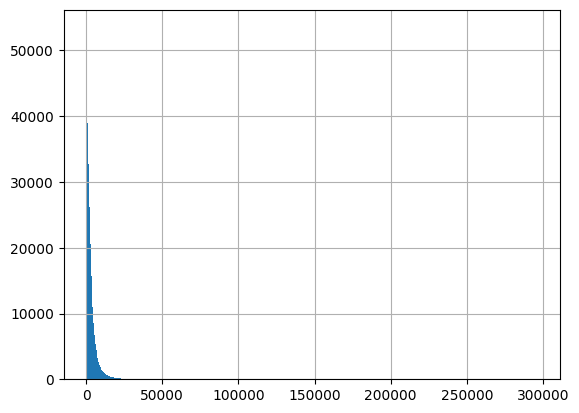

In [34]:
nbtx.volume.hist(bins=1000)

Looking at the standard deviation of volumes, it makes sense if one decides to resample by **VWAP**.
Also, and more importantly, this method takes into account the effect of traded volume in determining the market price,
While **TWAP** does not. Another option which is the last recorded price is simple and relatively good resampling method, but just for small time frames. This method for time frames like 1 day is naive and prone to noise.

In [35]:
def vwap(price, volume):
    '''
        Volume-Weighted Average Price calculation
    '''
    if volume.sum() == 0: return np.nan
    return (price * volume).sum() / volume.sum()

In [36]:
def resample(df, freq):
    '''
        Resampling function by VWAP method and a frequency parameter.
        Note that the last row associated to datetime = 2023-12-01 00:00:00 omitted from calculation.
    '''
    res = df[:-1].resample(freq, label='right').apply(lambda win: vwap(win['close'], win['volume']))
    return res

In [37]:
resample(tbdl, '5min')

2022-12-01 00:05:00    36579.000000
2022-12-01 00:10:00    36647.464479
2022-12-01 00:15:00    36600.000000
2022-12-01 00:20:00    36600.000000
2022-12-01 00:25:00    36609.987624
                           ...     
2023-11-30 23:40:00    50767.000000
2023-11-30 23:45:00    50756.592201
2023-11-30 23:50:00    50794.000000
2023-11-30 23:55:00    50759.905227
2023-12-01 00:00:00    50757.485115
Freq: 5min, Length: 105120, dtype: float64

> I store the resampled data into a dictionary with frequency (in minutes) as keys, and dataframes like below as values.

In [38]:
rawtsdf = {
    '1': pd.DataFrame(
        {
            'nobitex': nbtx.close,
             'tabdeal': tbdl.close,
             'implied': impl.close,
        }
    )
}

In [39]:
rawtsdf['1']

,nobitex,tabdeal,implied
2022-12-01 00:00:00,36465.0,NaN,NaN
2022-12-01 00:01:00,36468.0,NaN,36458.845709
2022-12-01 00:02:00,36469.0,NaN,NaN
2022-12-01 00:03:00,36470.0,36579.0,36460.043713
2022-12-01 00:04:00,36469.0,36579.0,NaN
...,...,...,...
2023-11-30 23:56:00,50760.0,50749.0,NaN
2023-11-30 23:57:00,50779.0,NaN,50740.201884
2023-11-30 23:58:00,50780.0,50756.0,50736.029623
2023-11-30 23:59:00,50778.0,NaN,50760.201963


In [40]:
freqs = ['5', '20', '60', '1440']
exchanges = [nbtx, tbdl, impl]
mapper = {0: 'nobitex', 1: 'tabdeal', 2: 'implied'}
for freq in freqs:
    res = []
    for exchange in exchanges:
        res.append(resample(exchange, freq=freq+'min'))
    rawtsdf[freq] = pd.concat(res, axis=1).rename(columns=mapper)

In [41]:
save_or_load('rawtsdata.pkl', 'wb', rawtsdf)

In [42]:
rawtsdf = save_or_load('rawtsdata.pkl', 'rb')

## Handling Market Anomalies

I want to first handle outliers, before missing data filling.
Because filling data with methods such as forward fill or linear interpolation
can make a outlier datapoint normal in it's local statistics.

A simple yet effective method could be calculating **z-score** for each datapoint on a window around them,
and if it's greater than a threshold (say 2) in absolute value, scale it down to average of that window by a factor.

In [43]:
def detect_outliers(prser, window=20, zthresh=2):
    '''
        Detect outliers by the metric of abs(z-score) > zthresh.
        Get price series as input and return dataframe of outliers detected along with their mean, std, and z-score.
    '''
    prdf = pd.DataFrame(prser)
    # rolling mean, std, and z-score
    prdf['rolling_mean'] = prser.rolling(window, min_periods=0, center=True).mean()
    prdf['rolling_std'] = prser.rolling(window, min_periods=0, center=True).std().replace(0, np.nan)
    prdf['rolling_zscore'] = (prser - prdf['rolling_mean']) / prdf['rolling_std']
    # detect outliers
    outliers = prdf[np.abs(prdf['rolling_zscore']) > zthresh]
    return outliers

In [44]:
def correct_outliers(prser, outliers, scale=1/4):
    '''
        Scale outliers down to their averages by a scale factor.
        Get original price series and outliers dataframe, correct and combine the price into original series and return it.
    '''
    def correct_row(row):
        value = row.iloc[0]
        if row['rolling_zscore'] > 0:
            uplim = row['rolling_mean'] + row['rolling_std']
            return uplim + scale * (value - uplim)
        else:
            downlim = row['rolling_mean'] - row['rolling_std']
            return downlim + scale * (value - downlim)
    # correct and combine
    corrected = outliers.apply(correct_row, axis=1)
    return corrected.combine_first(prser)

In [45]:
def detect_and_correct_outliers(prser, window=20, zthresh=2, scale=1/4):
    '''
        Original price series as input, and corrected price series as output.
    '''
    outliers = detect_outliers(prser, window, zthresh)
    return correct_outliers(prser, outliers, scale)

In [46]:
# for 1min data
cor = rawtsdf['1'].apply(detect_and_correct_outliers)
cor

,nobitex,tabdeal,implied
2022-12-01 00:00:00,36465.0,NaN,NaN
2022-12-01 00:01:00,36468.0,NaN,36458.845709
2022-12-01 00:02:00,36469.0,NaN,NaN
2022-12-01 00:03:00,36470.0,36579.0,36460.043713
2022-12-01 00:04:00,36469.0,36579.0,NaN
...,...,...,...
2023-11-30 23:56:00,50760.0,50749.0,NaN
2023-11-30 23:57:00,50779.0,NaN,50740.201884
2023-11-30 23:58:00,50780.0,50756.0,50736.029623
2023-11-30 23:59:00,50778.0,NaN,50760.201963


Let's see how this method works on:
1. a nobitex continuous interval
2. a tabdeal discontinuous interval
3. a tabdeal sparse interval

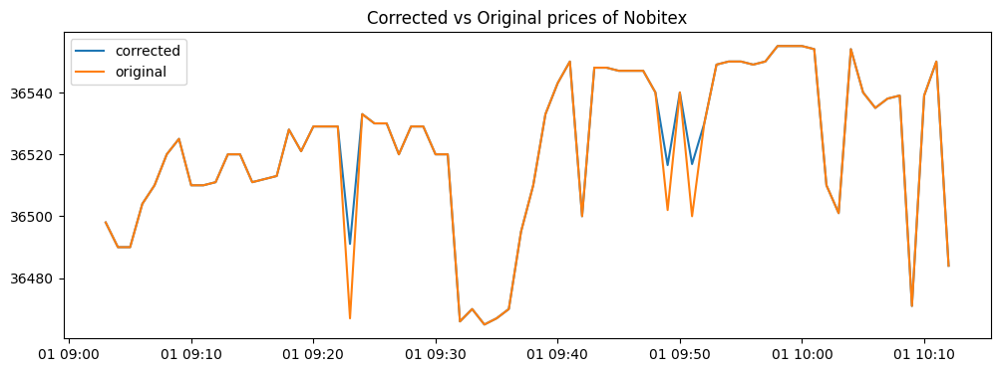

In [47]:
plt.figure(figsize=(12, 4))
plt.plot(cor.nobitex['2022-12-01 09:03:00':'2022-12-01 10:12:00'], label='corrected')
plt.plot(rawtsdf['1'].nobitex['2022-12-01 09:03:00':'2022-12-01 10:12:00'], label='original')
plt.title('Corrected vs Original prices of Nobitex')
plt.legend()
plt.show()

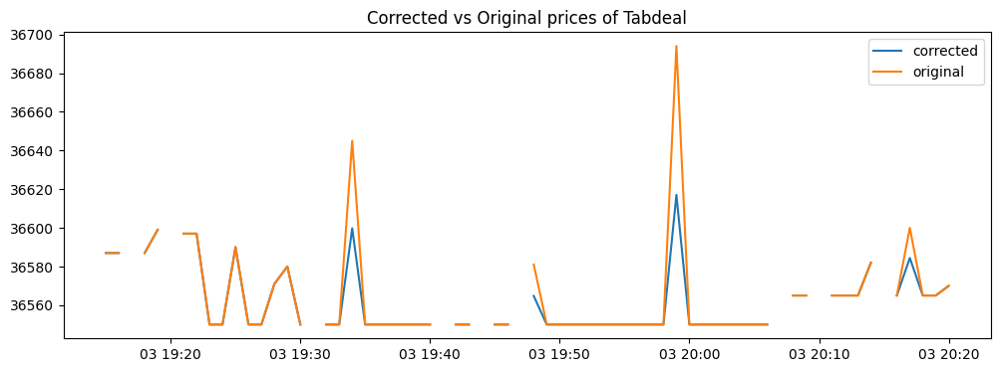

In [48]:
plt.figure(figsize=(12, 4))
plt.plot(cor.tabdeal['2022-12-03 19:14:00':'2022-12-03 20:20:00'], label='corrected')
plt.plot(rawtsdf['1'].tabdeal['2022-12-03 19:14:00':'2022-12-03 20:20:00'], label='original')
plt.title('Corrected vs Original prices of Tabdeal')
plt.legend()
plt.show()

Here I want to define a helper function which detects consecutive occurences of a condition in a series:

In [49]:
def detect_consec(condition):
    '''
        Return a dataframe with one column of 'number of consecutive occurences of a condition in a series' as nconsec,
        and start index of each as the index.
    '''
    consec = condition.groupby((~condition).cumsum()).agg(
        nconsec = 'sum',
        startdt = lambda x: x.index[0]
    )
    consec = consec[consec['nconsec'] > 0]
    consec = consec.set_index('startdt')
    return consec.sort_values('nconsec')

In [50]:
# consecutive nan values of the raw tabdeal price series
tbdlprser = rawtsdf['1'].tabdeal
consecnans = detect_consec(tbdlprser.isna())

In [51]:
consecnans[consecnans['nconsec'] == 10].sort_index()

,nconsec
startdt,
2022-12-01 14:12:00,10
2022-12-01 17:54:00,10
2022-12-02 11:28:00,10
2022-12-02 11:45:00,10
2022-12-02 17:47:00,10
...,...
2023-11-27 02:38:00,10
2023-11-27 02:49:00,10
2023-11-28 03:18:00,10


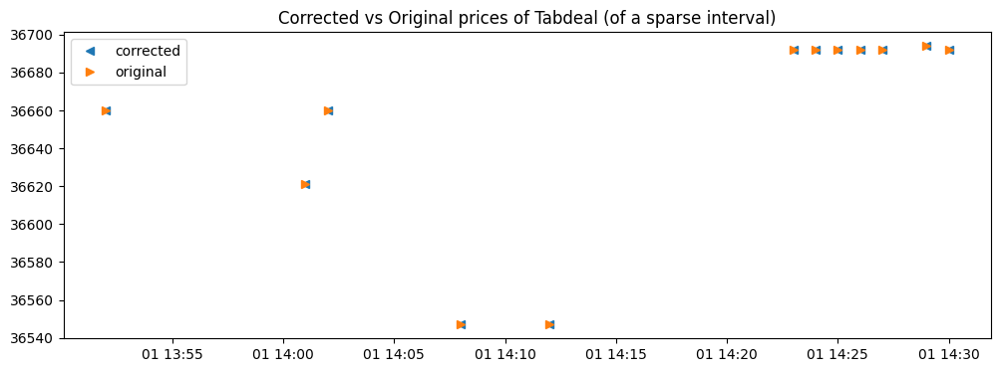

In [52]:
plt.figure(figsize=(12, 4))
plt.plot(cor.tabdeal['2022-12-01 13:52:00':'2022-12-01 14:32:00'], '<', label='corrected')
plt.plot(rawtsdf['1'].tabdeal['2022-12-01 13:52:00':'2022-12-01 14:32:00'], '>', label='original')
plt.title('Corrected vs Original prices of Tabdeal (of a sparse interval)')
plt.legend()
plt.show()

> I store corrected data into another dictionary similar to `rawtsdf` structure, instead it's the corrected one `cortsdf`:

In [53]:
# main computation for outlier detection and correction
cortsdf = {freq: df.apply(detect_and_correct_outliers) for freq, df in rawtsdf.items()}

In [54]:
save_or_load('cortsdata.pkl', 'wb', cortsdf)

In [55]:
cortsdf = save_or_load('cortsdata.pkl', 'rb')

## Missing Data

I consider 3 candidate methods for missing data filling:
1. forward fill --> suitable for small gaps
2. linear splines interpolation --> can be justified for larger gaps
3. cubic splines interpolation --> computationally expensive for large datasets, but better approximation

In [56]:
def inspect_consec_nans(prser):
    '''
        Return the number of consecutive nan values in a price series,
        and also histogram plot of consecutive nans length.
    '''
    n, nnan = prser.size, prser.isna().sum()
    print('{} nan values out of {} timestamps'.format(nnan, n))
    consecnans = detect_consec(prser.isna())
    ax = consecnans.nconsec.hist(bins=consecnans.max().iloc[0])
    ax.set_title('histogram of consecutive nans length')
    plt.show()

In [57]:
def fill_missing(prser, method):
    '''
        Takes price series and fill missing data by the method specified.
        method argument can take values:
            'ffill' for forward fill
            'linear' for linear splines interpolation
            'cubic' for cubic splines interpolation
    '''
    if method == 'ffill': return prser.ffill()
    elif method == 'linear': return prser.interpolate(method='linear')
    elif method == 'cubic': return prser.interpolate(method='spline', order=3)

Nobitex 1min price series:

8406 nan values out of 525601 timestamps


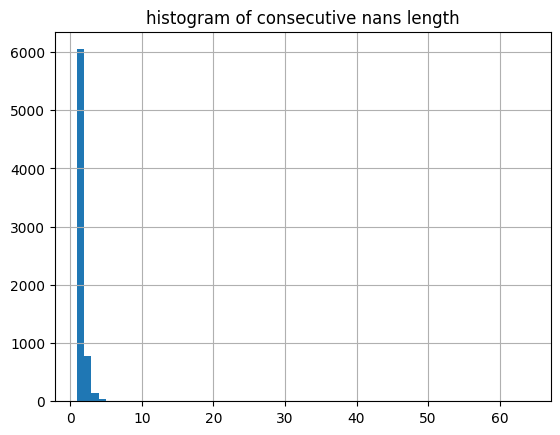

In [58]:
inspect_consec_nans(cortsdf['1'].nobitex)

You can see Nobitex dataset is almost continuous, so there is no significant difference which method is used for Nobitex.

But what about Tabdeal and Implied datasets?

First of all, Implied dataset has almost the same `NaN` values in the same datetimes as Tabdeal has, since Implied dataset is stemmed from Tabdeal dataset.

Then, let's inspect consecutive `NaN` values of Tabdeal in 1min and 5min frequencies:

304661 nan values out of 525601 timestamps


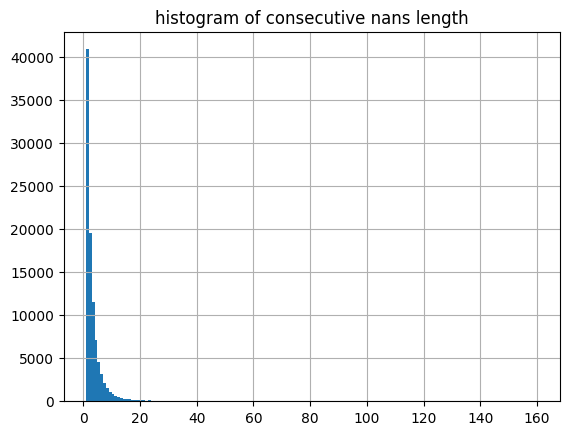

In [59]:
# 1min frequency
inspect_consec_nans(cortsdf['1'].tabdeal)

18492 nan values out of 105120 timestamps


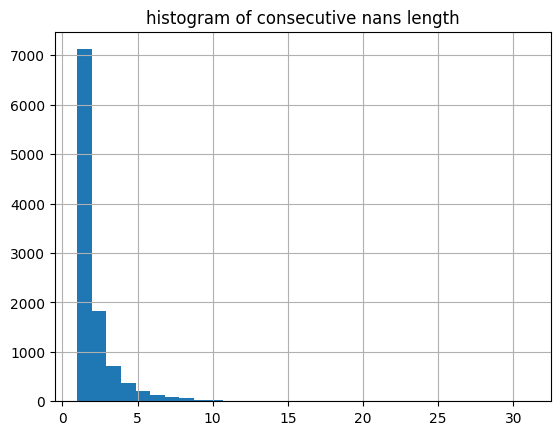

In [60]:
# 5min frequency
inspect_consec_nans(cortsdf['5'].tabdeal)

Most of gaps in 1min frequncy is less than 10 in consecutive length, and 6 for 5min data.

20min data has smaller gaps, and a few in 60min and almost no gaps in 1day data.

Based on what was said, I use these methods for the time frames:

TimeFrame | Method
---|---
1min & 5min| linear splines
20min | forward fill
60min & 1day | cubic splines

> I store final data into a dictionary, again in the same structure as `rawtsdf` and/or `cortsdf`:

In [61]:
tsdf = {}
tsdf['1'] = rawtsdf['1'].apply(lambda prser: fill_missing(prser, method='linear')).bfill()
tsdf['5'] = rawtsdf['5'].apply(lambda prser: fill_missing(prser, method='linear')).bfill()

In [62]:
tsdf['20'] = rawtsdf['20'].apply(lambda prser: fill_missing(prser, method='ffill')).bfill()

In [63]:
tsdf['60'] = rawtsdf['60'].apply(lambda prser: fill_missing(prser, method='cubic')).bfill()
tsdf['1440'] = rawtsdf['1440'].apply(lambda prser: fill_missing(prser, method='cubic')).bfill()

In [64]:
save_or_load('tsdata.pkl', 'wb', tsdf)

In [65]:
tsdf = save_or_load('tsdata.pkl', 'rb')

# Task 2: Exploratory Data Analysis (EDA)

## Log Returns, Volatility, and Normality Assessment

### Log Returns Computation

In [66]:
def log_return(prser):
    '''
        Log return calculator of a price series.
    '''
    return np.log(prser / prser.shift(1)).dropna()

In [67]:
lrdf = {freq: df.apply(log_return) for freq, df in tsdf.items()}

In [68]:
save_or_load('lrdfdata.pkl', 'wb', lrdf)

In [69]:
lrdf = save_or_load('lrdfdata.pkl', 'rb')

### Volatility Estimation and Clustering Analysis with EWMA

> NOTE: This method is deprecated, see EWMA Volatility below instead.

First of all, I obtain historical volatility for each time point by measuring sample standard deviation of p past values of log return.

Then I smoothen the result by EWMA method and store it into `voldf` variable.

But how many past values (p) should I consider for calculating historical volatility?

Let's expand a window (from index 0 to an ascending index t) and check for where the first fluctuations of historical volatility (due to insufficient frame size) is stabilized?

In [25]:
max_t = 1000
expandstd = {freq: df.expanding().std().reset_index(drop=True)[:max_t] for freq, df in lrdf.items()}

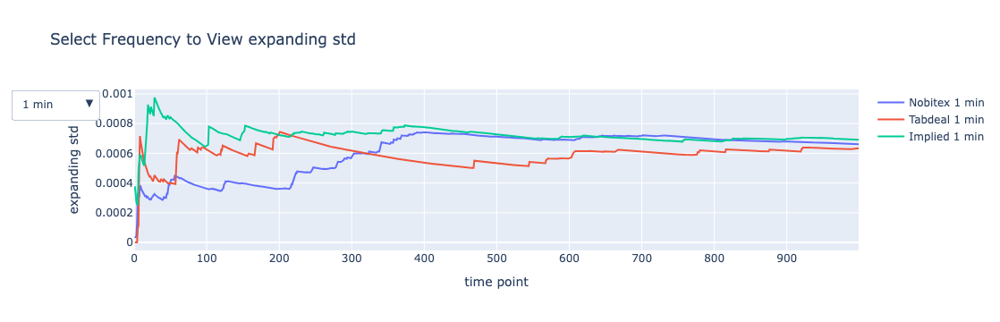

In [14]:
plot_tsdf_like(expandstd, 'expanding std', xaxis_title='time point')

I think `60` is a sufficient frame size.

> NOTE: By this, I assumed volatility is a statistic related to 60 past time points in each time scale.
This leads to observe more time memory in daily time frames with respect to minutely data.
Compare hourly data with daily in the volatility figure below.

Now let's caculate historical volatility of log returns by `window=60`:

In [15]:
stdf = {freq: df.rolling(window=60, min_periods=0).std().bfill() for freq, df in lrdf.items()}

EWMA by `window=10` and `alpha=0.9` to have the final result of volatility:

In [126]:
voldf = {
    freq: df.rolling(window=10, min_periods=0).apply(lambda window: window.ewm(alpha=0.9).mean().iloc[-1])
    for freq, df in stdf.items()
}

In [70]:
# save_or_load('voldfdata.pkl', 'wb', voldf)

In [71]:
# voldf = save_or_load('voldfdata.pkl', 'rb')

#### EWMA Volatility

I noticed that there could be a simpler and more robust method for measuring volatility, calculated by below function:

In [72]:
def ewma_volatility(ser, alpha=0.1):
    '''
        Measure volatility of a series by subtracting exp moving averages from values, squaring differences,
        another exp moving average on squared differences, and finally taking square root.
    '''
    ma = ser.ewm(alpha=alpha).mean()
    squared_dif = np.square(ser - ma)
    return np.sqrt(squared_dif.ewm(alpha=alpha).mean())

In [97]:
# new volatility
voldf = {freq: df.apply(ewma_volatility) for freq, df in lrdf.items()}

In [98]:
save_or_load('newvoldfdata.pkl', 'wb', voldf)

> So I will replace all the volatilities with the new one.

#### Price Series, Log Return, and Volatility Plots

Before going to inspect statistical features of these series, let's plot them.

In [17]:
# plot_tsdf_like(tsdf, 'Price')

`plot_tsdf_like` increases the size of notebook significantly, instead set the frequency and see the plot:

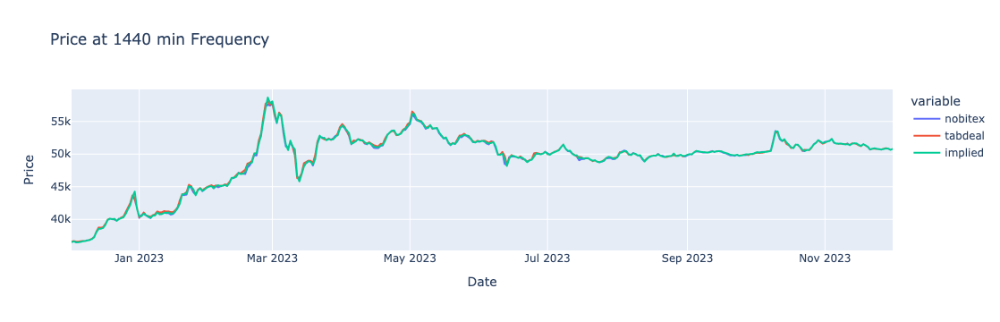

In [13]:
# Price series at frequency
freq = '1440'
px.line(tsdf[freq], labels=dict(index='Date', value='Price'), title=f'Price at {freq} min Frequency')

In [76]:
# plot_tsdf_like(lrdf, 'Log Return')

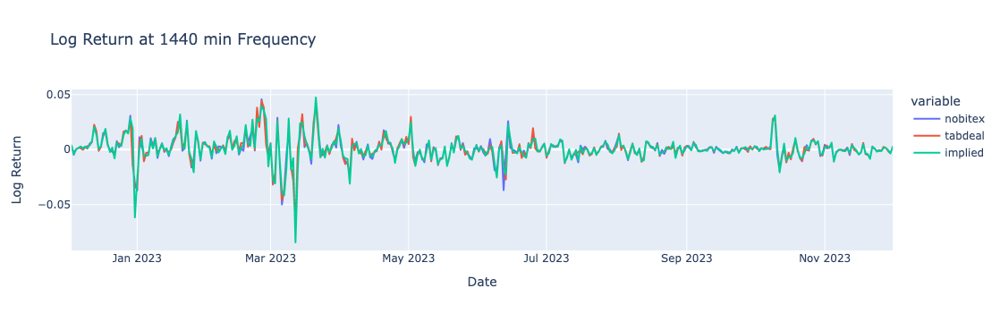

In [14]:
# Log Return at frequency
freq = '1440'
px.line(lrdf[freq], labels=dict(index='Date', value='Log Return'), title=f'Log Return at {freq} min Frequency')

In [78]:
# plot_tsdf_like(voldf, 'Volatility')

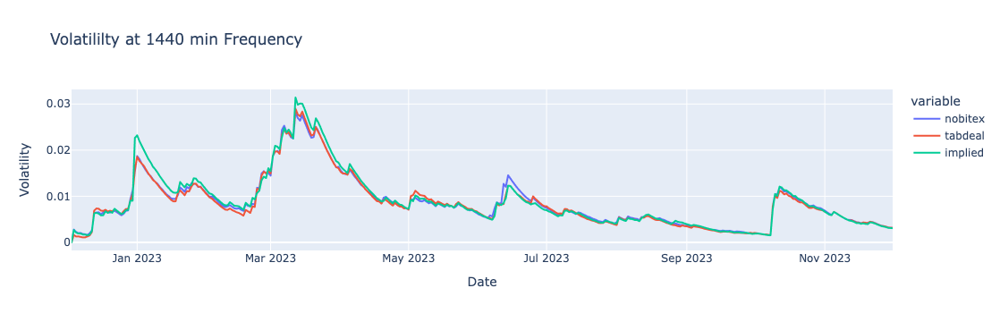

In [15]:
# new volatility at frequency
freq = '1440'
px.line(voldf[freq], labels=dict(index='Date', value='Volatility'), title=f'Volatililty at {freq} min Frequency')

#### Volatility Clustering

Volatility is recognized as an indicator of market fear or excitement, and this can be easily observed on plots. By looking at price and volatility plots at the same time, different volatility regimes can be identified as follows:

* *December 11 to January 6*
* *January 18 to January 30*
* *February 20 to April 8*: Although the price increase trend started around February 10, its impact on volatility is noticeable from February 20. It seems that concerns about the dollar's price started to increase significantly from this date. With every sharp rise or fall in the dollar's price, volatility peaks locally, with the highest excitement in the market observed on February 26 between hours of 14:00 and 16:00, when the dollar's price fluctuated between 61k to 53k tomans.

Other periods of increasing volatility are also observed, such as *June 7 to June 27*, and *October 6 to October 16*, which are shorter periods and could be related to a shock from news or a political or economic event. At other times, volatility oscillates stably at its minimum.

Based on volatility changing amplitude over different time periods, it seems that ARCH (or GARCH) models would perform a good model for volatility.

And by observing implied volatility in the period from August 16 to the end of the period (November), we notice an abnormal increase in implied volatility, which could be due to the increase in volatility of Bitcoin. It is important to note that implied price is the product of two prices.

#### Risk Management Practices and Strategic Decision-Making Based on Volatility

In high and low volatility regimes, we can take different approaches. Such as increasing **position size** in low volatility,
tighter **stop-loss levels** as apposed to wider in high volatility. Also in high volatility regimes, we can use strategies
like **straddle** or **strangle** which both of them are strategies based on call and put options. For low volatility regimes
it's more reasonable to employ **mean reversion** strategies.

### Statistical Summaries

#### Log Return

Before going to calculate statistics, let's look at the histogram of Log Return and have a Kernel Density Estimation for each:

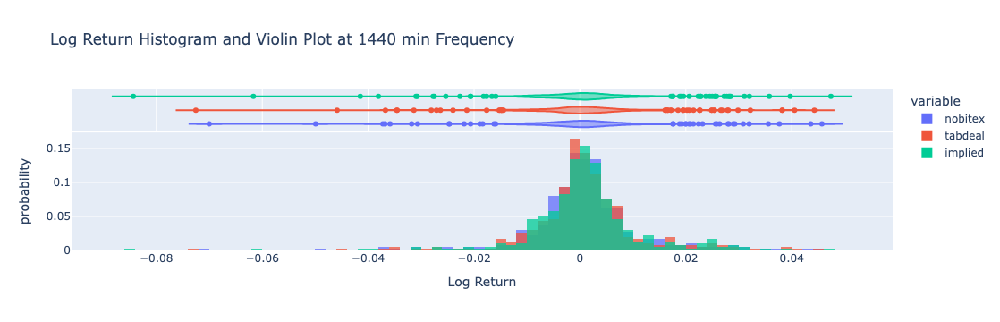

In [16]:
# log return histogram with violin marginal
freq = '1440'

px.histogram(
    lrdf[freq], marginal='violin', histnorm='probability',
    labels=dict(value='Log Return'), title=f'Log Return Histogram and Violin Plot at {freq} min Frequency',
    barmode='overlay', opacity=0.75,
)

In [17]:
# # normal kde of log return with rug marginal

# import plotly.figure_factory as ff

# freq = '1440'

# bin_size = {'1440': 0.005, '60': 0.001, '20': 0.0005, '5':  0.0002, '1': 0.0001}
# columns = ['nobitex', 'tabdeal', 'implied']
# x = [lrdf[freq][exchange] for exchange in columns]
# fig = ff.create_distplot(
#     x, group_labels=columns, bin_size=bin_size[freq],
#     curve_type='normal', histnorm='probability',
#     colors=COLORS
# )
# fig.update_layout(
#     title=f'Distribution Plot of Log Return with Normal KDE at {freq} min Frequency',
#     xaxis_title='Log Return',
#     yaxis_title='probability',
#     height=600,
# )
# fig.show()

The plots seems to be normal. Let's plot Empirical CDF:

In [18]:
# # ecdf of log return
# freq = '1440'

# px.ecdf(
#     lrdf[freq], markers=True, lines=False,
#     labels=dict(value='Log Return'), title=f'Empirical Cumulative Distribution at {freq} min Frequency',
# )

After visual inspection on their distributions, it's time to see the statistics:

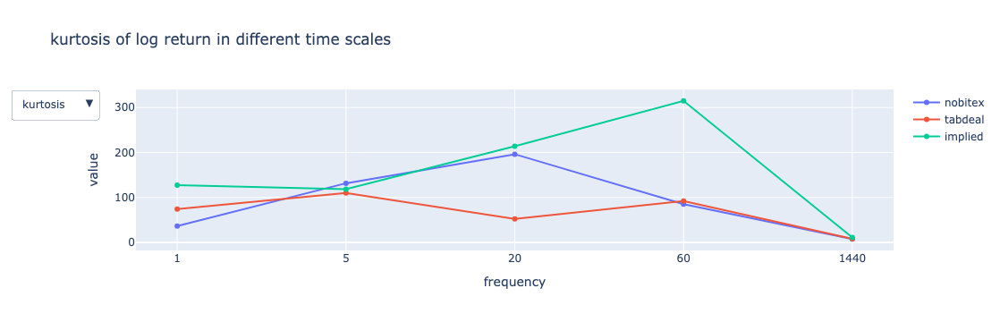

In [91]:
plot_stats(lrdf, 'log return')

For interpreting the statistics we need to notice some points:
* As frequency increases, the proportion of zero log returns decreases due to resampling in larger windows
will remain less missing values which consecutive missing values can cause constant prices in filling values and therefore zero log returns. For example this lead to drastically decrease in kurtosis of Tabdeal in comparison with Nobitex in 20 min frequency. Remember that Tabdeal had a huge amount of missing values and prone to zero log returns, additionally I filled them with forward fill in 20 min frequency which happens to be a bad choice and amplified the effect of zero log returns in kurtosis. Increase in std can be justified in this perspective.

* There is insufficient datapoints in 1440 min frequency so that it could not catch the average near to zero, and slow increasing of std.

* The more and further outliers are from mean in the scale of standard deviation, the higher kurtosis increases. Why kurtosis decrease in 60 and 1440 min frequencies? This can be due to balancing and consequently filtering out the outliers in larger resampling windows.

* The tendency of right (left) outliers to be more extreme could make skewness positive (negative). The above skewness of log returns shows that someone observing at the 5 min resampling frequency sees stronger positive log return *outliers*, while someone observing at 60 min sees stronger negative outliers.

* It's interesting that implied log returns behaves more like normal distribution than the others, with regard to there is more noise and variability present.

#### Volatility

Let's plot the histogram of volatility:

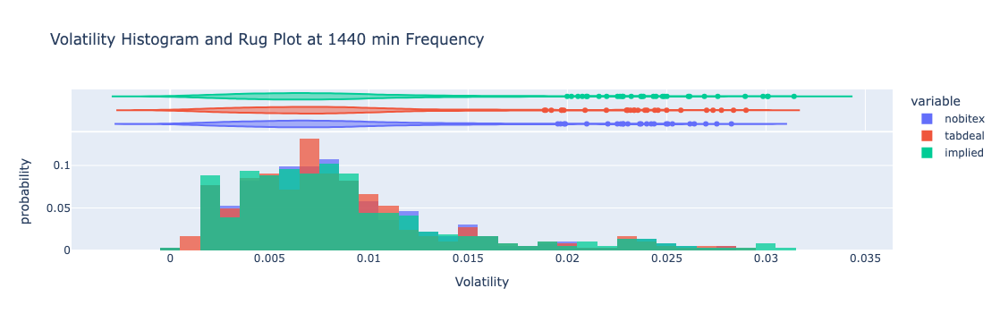

In [19]:
# volatility histogram
freq = '1440'

px.histogram(
    voldf[freq], marginal='violin', histnorm='probability',
    labels=dict(value='Volatility'), title=f'Volatility Histogram and Rug Plot at {freq} min Frequency',
    barmode='overlay', opacity=0.75,
)

By looking at the histogram it comes to mind that maybe this is a **log-normal** distribution. To find out, take the log of volatility and plot the histogram of the result:

In [110]:
logvoldf = {freq: df.apply(np.log).replace(-np.inf, np.nan).dropna() for freq, df in voldf.items()}

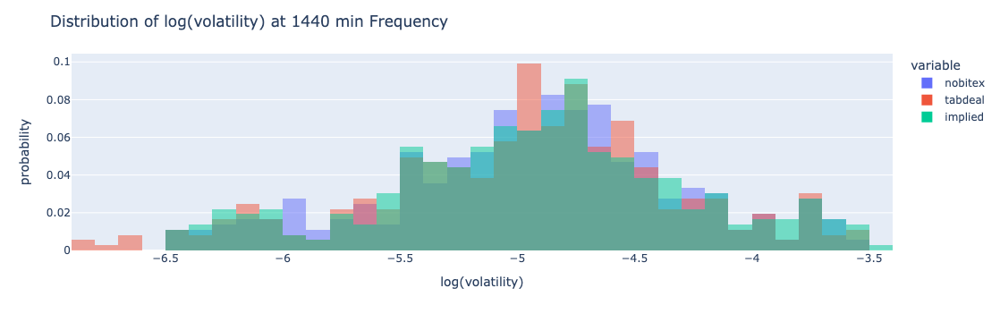

In [20]:
# log(volatility) histogram
freq = '1440'

px.histogram(logvoldf[freq], barmode='overlay', histnorm='probability').update_layout(
    title=f'Distribution of log(volatility) at {freq} min Frequency',
    xaxis_title='log(volatility)',
)

It seems close to normal distribution. We check the normality of log(volatility) in two sections ahead, graphically and quantitatively.

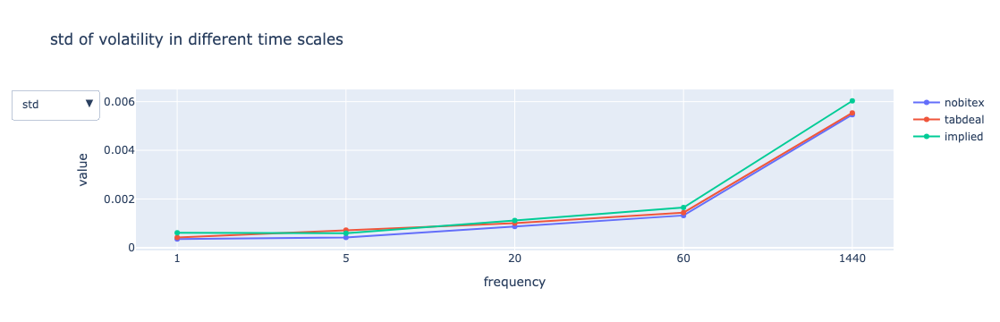

In [112]:
plot_stats(voldf, 'volatility')

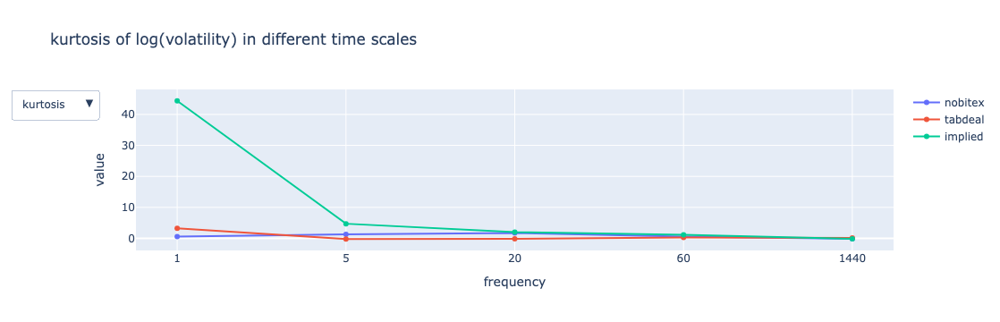

In [113]:
plot_stats(logvoldf, 'log(volatility)')

### Graphical Normality Tests

#### Log Return

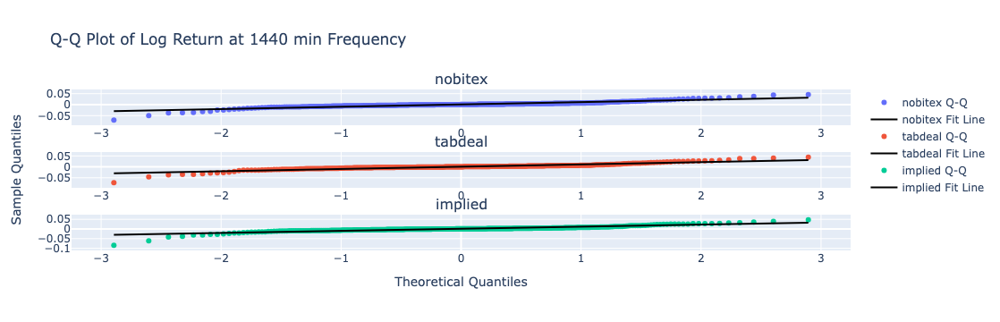

In [117]:
plot_QQ(lrdf, freq='1440', variable_name='Log Return')

Waterfall points shows that in the low (high) extremes, sample quantiles are lower (higher) than expected by normal distribution which means
the quantile happend to be in the lower (higher) values. This shows the distributions are fat-tailed, and can be modeled more accurately with **t-distributions**.

#### Log(Volatility)

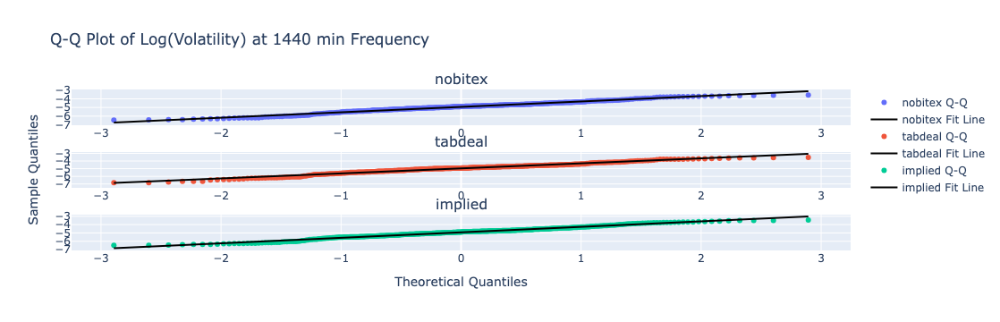

In [118]:
plot_QQ(logvoldf, freq='1440', variable_name='Log(Volatility)')

### Quantitative Normality Tests

P-value obtained from Shapiro-Wilk test for datasets more than 5000 in size could be inaccurate and hence I ommited p-values from test resullt.

#### Log Return

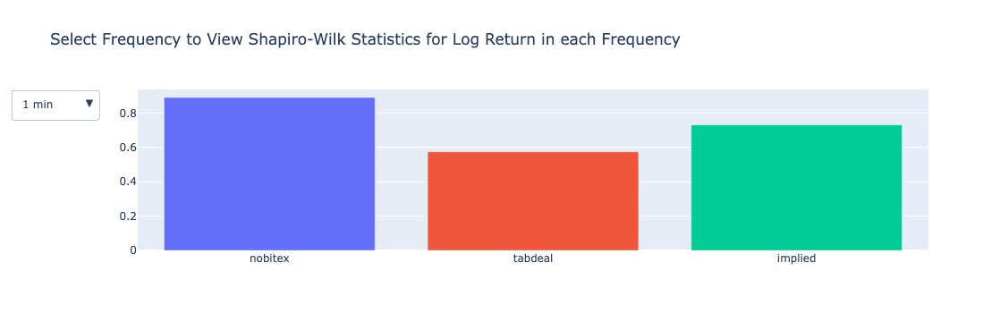

In [122]:
plot_shapiro_stats(lrdf, 'Log Return')

Low test statistics for Tabdeal in 1 min frequency is due to the discussed issue of Tabdeal (plenty of zero log returns).

All other distributions are close enough to 1 to be considered as normal.

#### Log(Volatility)

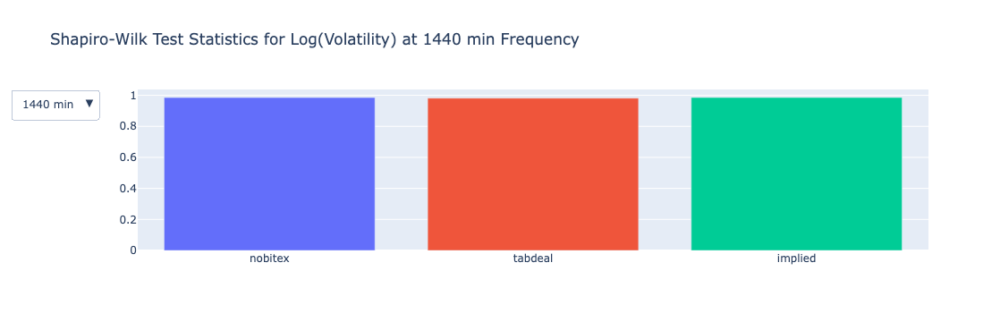

In [124]:
plot_shapiro_stats(logvoldf, 'Log(Volatility)')

So the **volatilities can be considered as log normal random variables**.

### Importance of Normality

In addition to simplifying the statistical analysis like regression analysis, normality is often assumed in models such as Value-at-Risk and the estimation of potential losses. If the returns are actually non-normal, the VaR estimates can significantly underestimate the probability and magnitude of extreme losses.

Option pricing models like Black-Scholes assume log returns to be normal and mispricing options can happen when there is skewness and/or kurtosis.

## Autocorrelation, Stationary Analysis, and Forecasting with ARIMA models

Let's start with log return which is persumably a stationary time series.

But first define some simple and useful functions for analysing a single time series (instead of tsdf-like data):

In [125]:
def fit_arima(ser, order, trend, vname, test_ratio=1/10, plot_forecast=True, plotter='pyplot'):

    idx = int(len(ser) * test_ratio)
    ser_train, ser_test = ser.iloc[:-idx], ser.iloc[-idx:]

    model = ARIMA(ser_train, order=order, trend=trend)
    model_fit = model.fit()
    print(model_fit.summary())

    if plot_forecast:
        
        forecast_results = model_fit.get_forecast(steps=len(ser_test))
        predictions, conf_ints = forecast_results.predicted_mean, forecast_results.conf_int()
        
        if plotter=='pyplot':
            plt.figure(figsize=(12, 4))
            plt.plot(ser_train, label='train'); plt.plot(ser_test, label='test')
            plt.plot(predictions, label='predicted mean')
            plt.plot(conf_ints.iloc[:, 0], label='lower conf. int.')
            plt.plot(conf_ints.iloc[:, 1], label='upper conf. int')
            plt.xlabel('Date'); plt.ylabel(vname)
            plt.legend(); plt.show()


    return model_fit

In [126]:
def acf_pacf(ser, vname):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
    plot_acf(ser, ax=ax1)
    plot_pacf(ser, ax=ax2)
    fig.suptitle(f'ACF & PACF for {vname}', y=1.1)
    ax1.set_xlabel('lag'); ax2.set_xlabel('lag')
    plt.show()

In [127]:
def check_normality(ser, vname):

    quantiles, least_squares = probplot(ser, dist='norm')
    theoretical_quantiles, sample_quantiles = quantiles
    slope, intercept, r = least_squares

    tstat = shapiro(ser, axis=0).statistic
    print(f'\nShapiro-Wilk test statistic for the {vname} = {tstat}\n')

    plt.figure(figsize=(6, 4))
    plt.scatter(theoretical_quantiles, sample_quantiles)
    plt.plot(theoretical_quantiles, slope * theoretical_quantiles + intercept, 'k')
    plt.xlabel('theoretical quantiles'); plt.ylabel('sample quantiles')
    plt.title(f'QQ plot of {vname}')
    plt.show()

In [128]:
def check_stationary_adf(ser, vname):

    tstat, pvalue, usedlag, nobs, critical_values, icbest = adfuller(ser)

    print(
        f'''
    For this {vname} series:
        - pvalue of non-stationary NH: {pvalue}
        - test statistic: {tstat}
        - compare with critical values: {critical_values}
        '''
    )

### Log Return

#### ACF & PACF

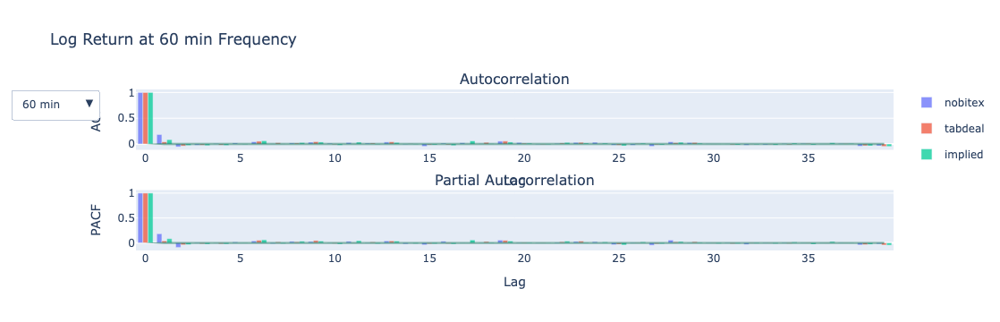

In [129]:
plot_acf_pacf(lrdf, 'Log Return')

Fast decay in both ACF & PACF plots implies that log return in all frequencies are stationary and there is no need to take differences or any other transformations. We will check stationarity quantitatively later on with ADF test.

Before going forward, I want to mention some points here in the ACF & PACF plots:

* Large negative value of autocorrelation in *1 min* frequency for *Nobitex* indicates a pattern of excessive changes in sign from one observation to the next, which you can see it in the below figures. Hence if you want to fit a model to *1 min* log returns, ARIMA(0, 0, 1) could be a good choice which is just an MA(1) without constant (zero mean).

* In each frequency there is an unexpected autocorrelation between 3h and 4h time interval! By that, I noticed that I did not synchronized the time-zone of Binance BTC-USDT with Tabdeal BTC-TMN. It will be corrected in the next section which is necessary.

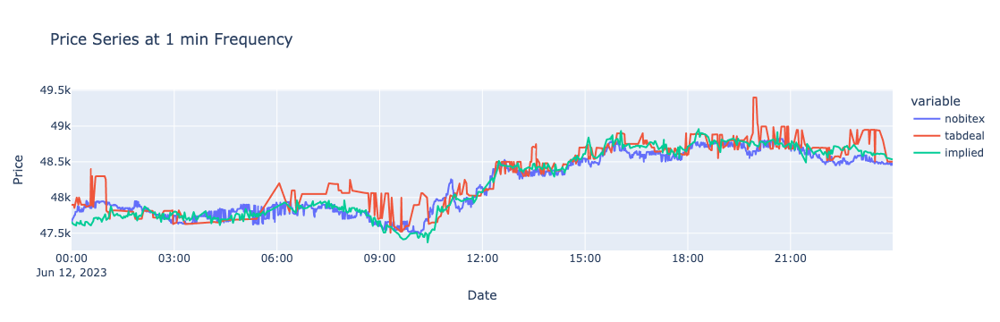

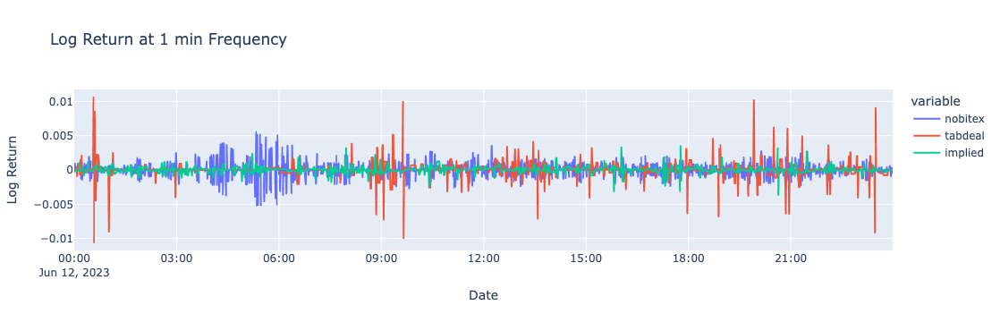

In [130]:
# Price Series and Log Return at frequency in date = Jun 11 & 12, 2023
freq = '1'

prfig = px.line(tsdf[freq]['2023-06-12':'2023-06-12'],
        labels=dict(index='Date', value='Price'), title=f'Price Series at {freq} min Frequency')

lrfig = px.line(lrdf[freq]['2023-06-12':'2023-06-12'],
        labels=dict(index='Date', value='Log Return'), title=f'Log Return at {freq} min Frequency')

prfig.show()
lrfig.show()

#### Modeling Nobitex **Log Returns** in 60 min Frequency

For now, I select log returns of Nobitex which is a well behaved time series among other options, and also I pick up 60 min frequency to reduce computational costs:

In [131]:
ser = lrdf['60'].nobitex
vname = 'log return (nobitex 60min)'

Check stationarity with ADF test:

In [132]:
check_stationary_adf(ser, vname)


    For this log return (nobitex 60min) series:
        - pvalue of non-stationary NH: 3.248265488925564e-27
        - test statistic: -14.672658546541134
        - compare with critical values: {'1%': -3.4311000545606776, '5%': -2.861871474145309, '10%': -2.566946438722175}
        


Low pvalue and t-statistic less than 1% critical value indicate stationarity. But I prefer to check stationarity with ACF & PACF plots that is visually informative. Let's look at these plots again:

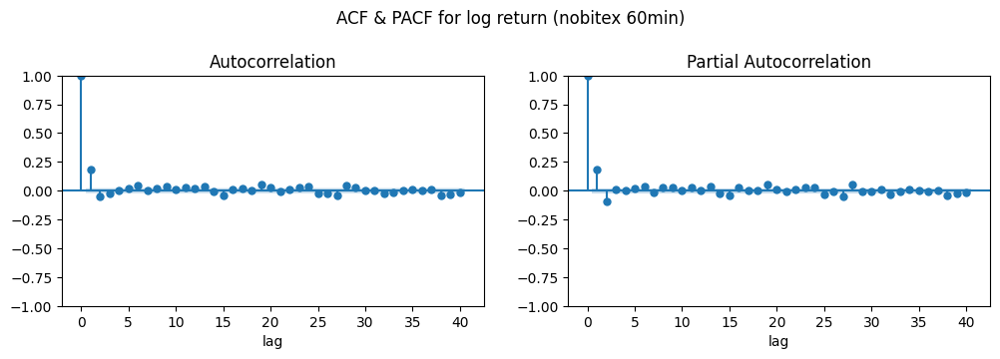

In [133]:
acf_pacf(ser, vname)

You can see fast decaying of autocorrelation which is an important sign of stationarity.

Now it's time to fit an ARIMA model to data and see the forecast. But what order should we choose?

There is just 1 positive significant autocorrelations in both ACF & PACF plots, which shows that the time series is slightly **underdifferenced**-i.e. the non-stationary pattern of positive autocorrelations has not been completely eliminated.

Hence we can **add AR(1) terms** in the forecasting equation, which **acts like a partial differencing**:

##### ARIMA(1, 0, 0)

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(1, 0, 0)   Log Likelihood               36577.530
Date:                Sun, 11 Aug 2024   AIC                         -73149.060
Time:                        03:53:13   BIC                         -73128.142
Sample:                    12-01-2022   HQIC                        -73141.894
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.259e-05   3.41e-05      1.250      0.211   -2.42e-05       0.000
ar.L1          0.1869      0.004     47.425      0.000       0.179       0.195
sigma2      5.467e-06   1.39e-08    394.300      0.0

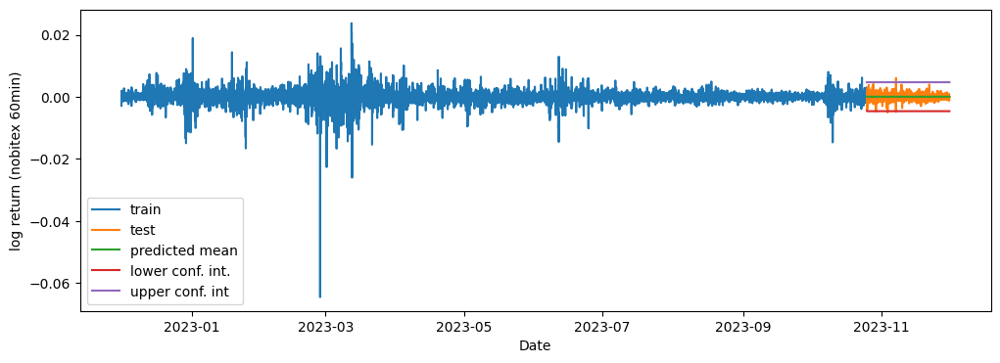

In [134]:
model_fit = fit_arima(ser, order=(1, 0, 0), trend='c', vname=vname, plot_forecast=True)

Keep in mind that **estimated white noise variance** which is the same **sigma2** coefficient is `5.467e-06` for `order=(1, 0, 0)`. The smaller this quantity, the better.

To know if the model is valid, we can check **residuals**, which should be **white noise** that is both **normal** and **stationary**:

In [135]:
resids = model_fit.resid

Check stationarity of residuals:

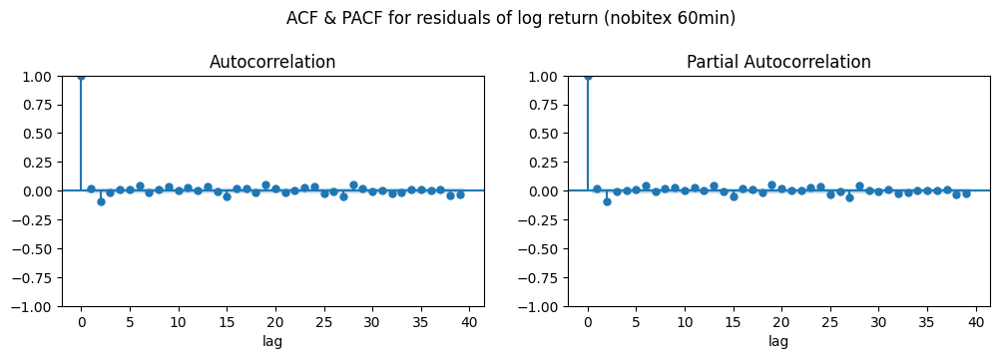

In [136]:
acf_pacf(resids, 'residuals of '+vname)

Notice that the lag 2 autocorrelation is not cancelled out. Later I compare AR(2) with AR(1) fitted here.

Check normality of residuals:


Shapiro-Wilk test statistic for the residuals of log return (nobitex 60min) = 0.7847332503000851



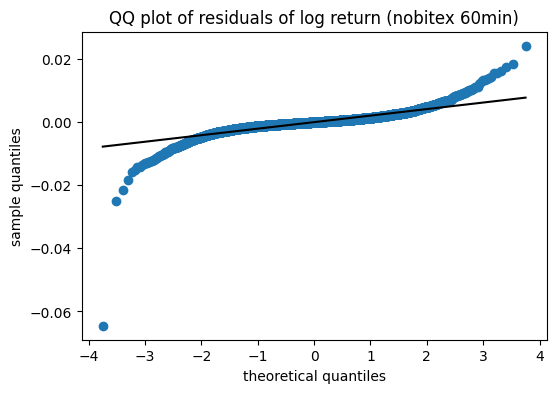

In [138]:
check_normality(resids, 'residuals of '+vname)

##### ARIMA(2, 0, 0)

Let's try AR(2) on data to see:
1. If the variance of white noise is reduced?
2. If the 2nd autocorrelation of residuals is cancelled?

In [148]:
model_fit = fit_arima(ser, order=(2, 0, 0), trend='c', vname=vname, plot_forecast=False)

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(2, 0, 0)   Log Likelihood               36611.039
Date:                Sun, 11 Aug 2024   AIC                         -73214.077
Time:                        04:01:09   BIC                         -73186.187
Sample:                    12-01-2022   HQIC                        -73204.524
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.261e-05   3.11e-05      1.370      0.171   -1.83e-05       0.000
ar.L1          0.2040      0.004     50.190      0.000       0.196       0.212
ar.L2         -0.0920      0.005    -19.740      0.0

Great! `sigma2` is **reduced** from `5.467e-06` to `5.421e-06` that can make me happy (notice that std err of this coefficient is increased but the increment is 3 order of 10 smaller than the sigma2 value itself).

There is more good news: **log likelihood** increased and more importantly **information criterions** are reduced.

At the end, let's look at residuals:

In [140]:
resids = model_fit.resid

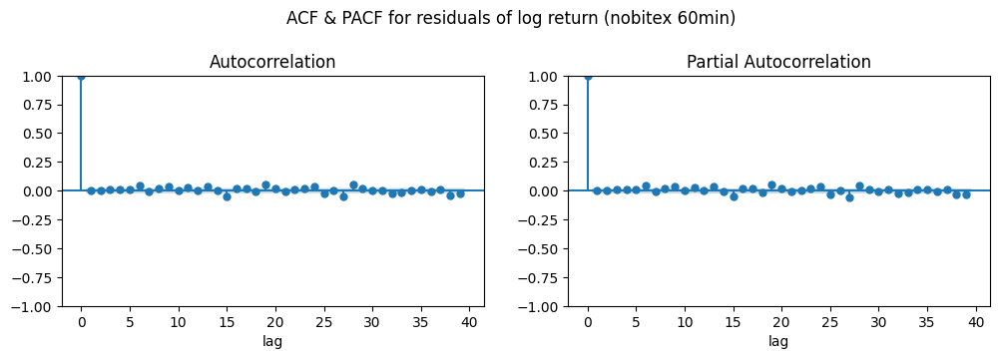

In [141]:
acf_pacf(resids, 'residuals of '+vname)

Which the *lag 2* autocorrelation is cancelled out, another good news.

##### ARIMA(0, 1, 2)

Sometimes an alternative way of modeling is **overdifferencing** the series and then **add MA terms** which can **partially cancel overdifferencings**.

First let's take difference of log returns and see the ACF & PACF of it:

In [142]:
serdif1 = ser.diff().dropna()
vname = 'log return (Nobitex 60min) with D=1'

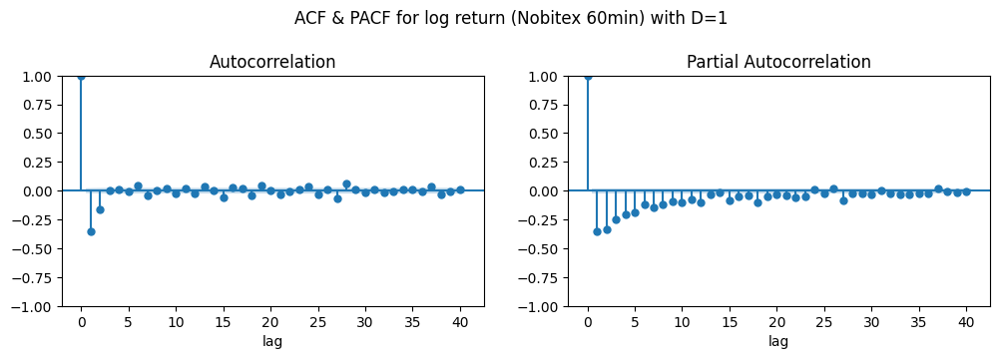

In [143]:
acf_pacf(serdif1, vname)

Overdifferencing shows itself with negative autocorrelations. Another sign of overdifferencing is the increase in variance of data. Let's compare variance of log return and differenced log return:

In [144]:
# increase in variance by overdifferencing
ser.var(), serdif1.var()

(5.222634887492329e-06, 8.526487289576995e-06)

But what order of MA terms should we add?

From ACF plot we can find out that adding 2 MA terms can be acceptable:

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(0, 1, 2)   Log Likelihood               36435.662
Date:                Sun, 11 Aug 2024   AIC                         -72863.324
Time:                        03:59:13   BIC                         -72835.434
Sample:                    12-01-2022   HQIC                        -72853.771
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1         -1.134e-07   2.88e-06     -0.039      0.969   -5.76e-06    5.53e-06
ma.L1         -0.6940      0.004   -198.145      0.000      -0.701      -0.687
ma.L2         -0.2053      0.004    -49.363      0.0

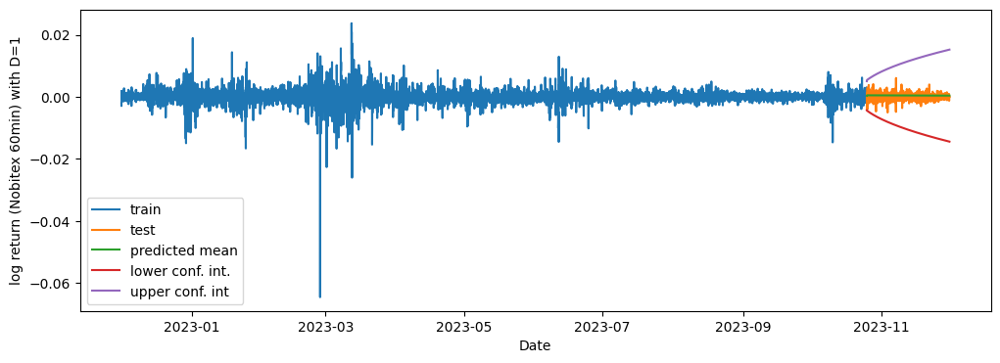

In [145]:
model_fit = fit_arima(ser, order=(0, 1, 2), trend='t', vname=vname, plot_forecast=True)

Which is obviously a worse choice, since *sigma2* is increased, *log likelihood* decreased, and *information criteria* are increased.

Let's look at residuals:

In [109]:
resids = model_fit.resid

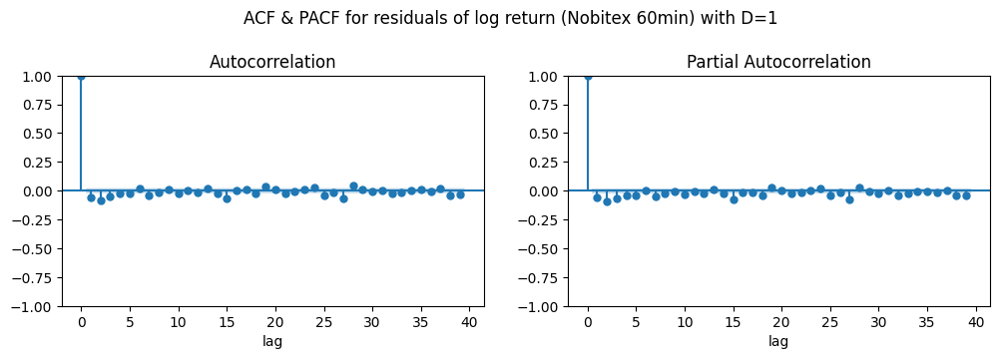

In [110]:
acf_pacf(resids, 'residuals of '+vname)

Negative autocorrelations are not cancelled out, bad news.

##### Auto ARIMA

For the final step, I want to use auto ARIMA to find the best ARIMA order:

In [146]:
import pmdarima as pm

# use auto_arima to find the best ARIMA order
auto_model = pm.auto_arima(ser, seasonal=False, trace=True,
                           error_action='ignore', suppress_warnings=True,
                           stepwise=True)

# print the best model summary
print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-82037.274, Time=1.51 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-81671.065, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-81970.630, Time=0.30 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-82018.745, Time=0.74 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-82036.684, Time=1.47 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=-82039.339, Time=0.67 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-82031.450, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-82040.901, Time=1.11 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=-82039.366, Time=0.84 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=-82037.331, Time=0.92 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-82040.871, Time=1.05 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0]          
Total fit time: 9.510 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observati

Which is the same `order=(2, 0, 0)` I considered as the best.

### Price Series

#### ACF & PACF

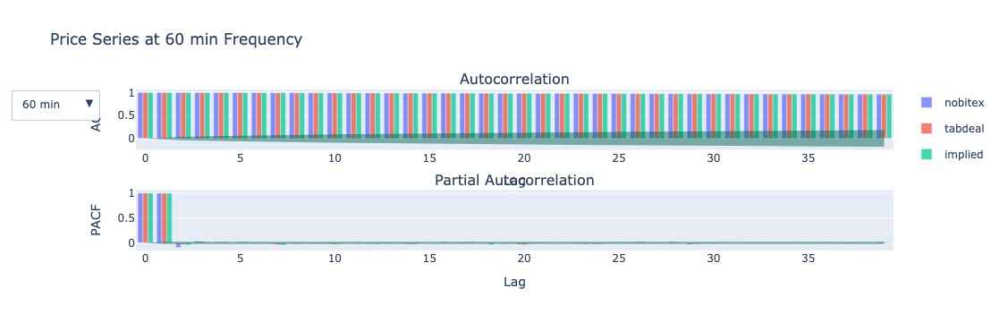

In [149]:
plot_acf_pacf(tsdf, 'Price Series')

Price series shows no decaying autocorrelation pattern in no frequencies which is typical of a **non-stationary** time series. This suggusts that at least 1 order of differencing is needed:

In [150]:
tsdfdif1 = {freq: df.diff().dropna() for freq, df in tsdf.items()}

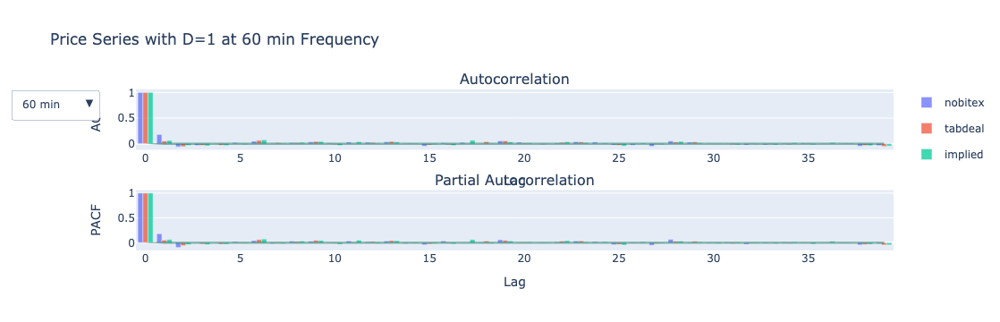

In [151]:
plot_acf_pacf(tsdfdif1, 'Price Series with D=1')

Which resembles a lot like the **log return** autocorrelation plots. This was expected, because $log(P_t) - log(P_{t-1}) = log(P_t / P_{t-1})$ which indicates that **differencing in logarithmic scale is just the log return value**, so we can use results from log return modeling here as well, except for an order of differencing. Therefore the optimal ARIMA order for Nobitex price series at 60 min freqeuncy should be `order=(2, 1, 0)`:

#### Modeling Nobitex **Price Series** in 60 min Frequency

In [152]:
ser = tsdf['60'].nobitex
vname = 'price series (nobitex 60min)'

Let's inspect stationarity of price series itself & with 1 order of differencing respectively:

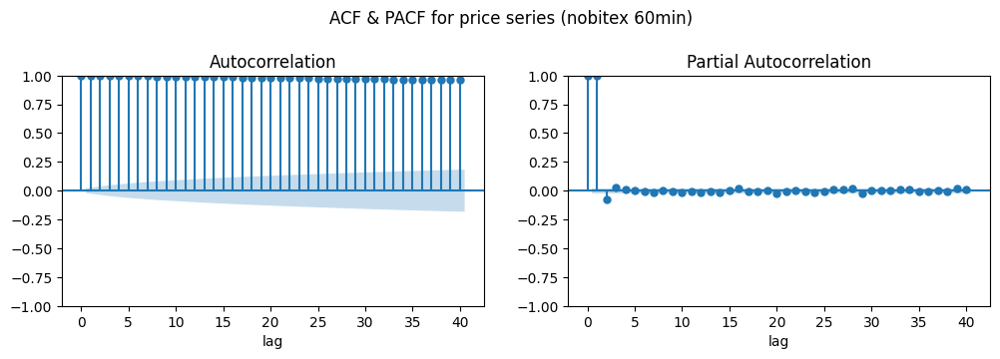

In [153]:
acf_pacf(ser, vname)

In [154]:
check_stationary_adf(ser, vname)


    For this price series (nobitex 60min) series:
        - pvalue of non-stationary NH: 0.04845508605507278
        - test statistic: -2.8740079201924895
        - compare with critical values: {'1%': -3.4310995387302516, '5%': -2.861871246211382, '10%': -2.566946317391388}
        


For price series itself, pvalue is below 0.05 and test statistic is below 5% critival value, but the autocorrelations say that **this ADF test results may not be valid**.

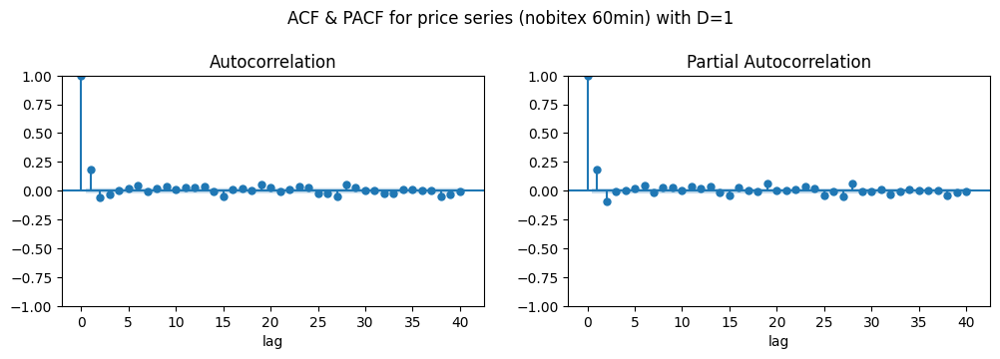

In [155]:
acf_pacf(ser.diff().dropna(), vname+' with D=1')

In [156]:
check_stationary_adf(ser.diff().dropna(), vname+' with D=1')


    For this price series (nobitex 60min) with D=1 series:
        - pvalue of non-stationary NH: 3.156232544057722e-27
        - test statistic: -14.681004415993613
        - compare with critical values: {'1%': -3.4311000545606776, '5%': -2.861871474145309, '10%': -2.566946438722175}
        


By looking at the equation that describes ARIMA(2, 1, 0):

$$
(\hat{Y}_{t} - Y_{t-1}) = \mu + \phi_1 (Y_{t-1} - Y_{t-2}) + \phi_2 (Y_{t-2} - Y_{t-3}) + WN(0, 1)
$$

we can say that the **price series is a random walk with growth (or drift) $\mu$ and is dependent on two previous lagged differences**.

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(2, 1, 0)   Log Likelihood              -48729.555
Date:                Sun, 11 Aug 2024   AIC                          97467.110
Time:                        04:03:45   BIC                          97494.999
Sample:                    12-01-2022   HQIC                         97476.663
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.8450      1.579      1.168      0.243      -1.250       4.940
ar.L1          0.1998      0.004     53.300      0.000       0.192       0.207
ar.L2         -0.0968      0.005    -20.945      0.0

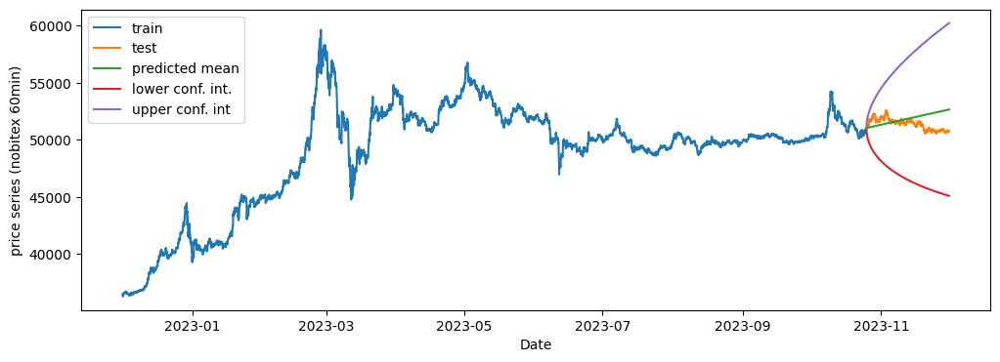

In [157]:
model_fit = fit_arima(ser, order=(2, 1, 0), trend='t', vname=vname, plot_forecast=True)

In [158]:
resids = model_fit.resid

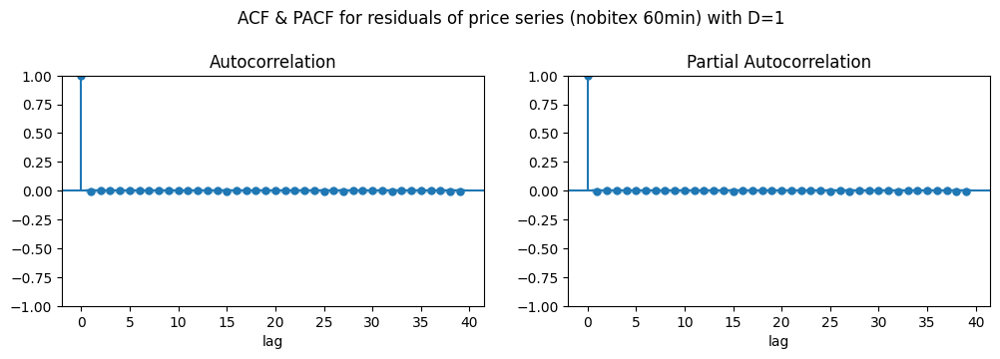

In [159]:
acf_pacf(resids, 'residuals of '+vname+' with D=1')

### Volatility

Modeling and forecasting volatility need more careful efforts, since volatility is a non-stationary time series with varying behaviour in variance.

I start with differencing and trying to fit an ARIMA model to it, then I will try log transformation to see if the result gets better or not. And finally I come up with a **GARCH** modeling and forecasting.

#### ACF & PACF

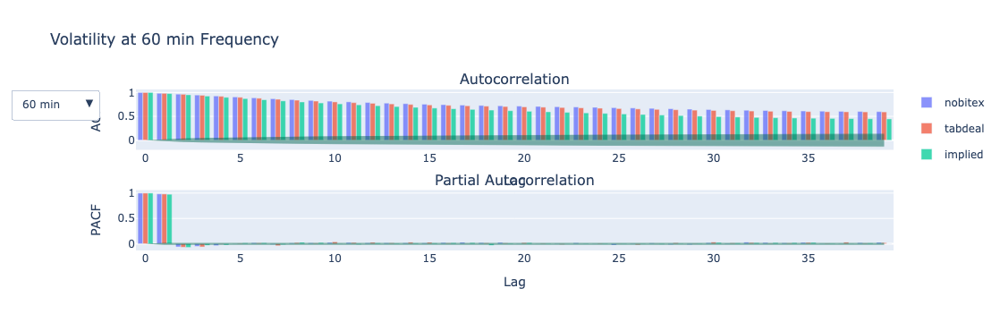

In [160]:
plot_acf_pacf(voldf, 'Volatility')

In [161]:
voldfdif1 = {freq: df.diff().dropna() for freq, df in voldf.items()}

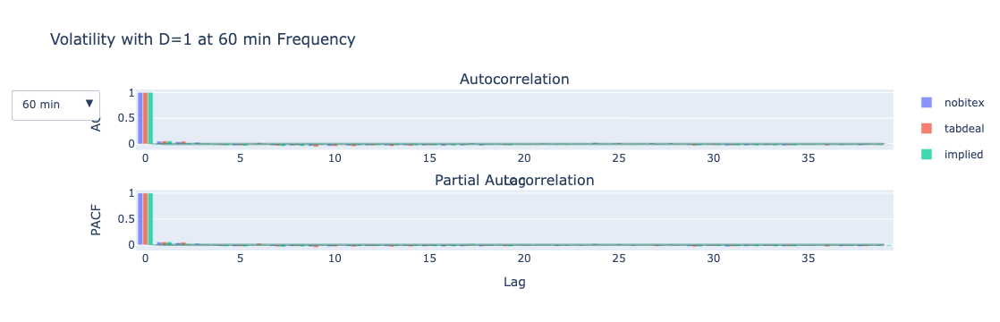

In [162]:
plot_acf_pacf(voldfdif1, 'Volatility with D=1')

In [163]:
voldfdif2 = {freq: df.diff().diff().dropna() for freq, df in voldf.items()}

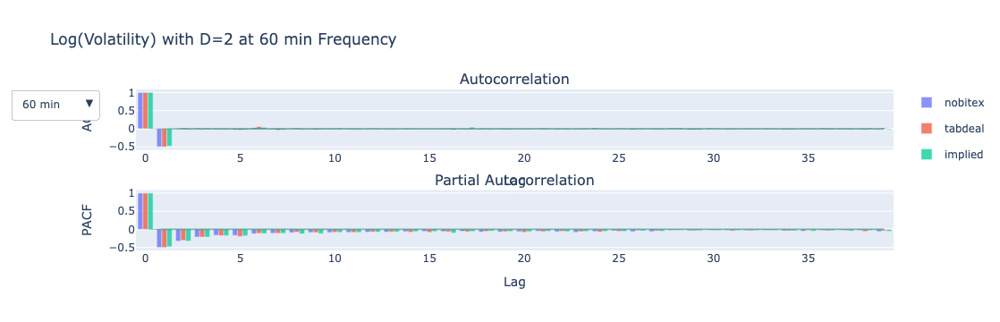

In [164]:
plot_acf_pacf(voldfdif2, 'Log(Volatility) with D=2')

You can see overdifferencing in the second order.

#### Modeling Nobitex **Volatility** in 60 min Frequency

In [165]:
ser = voldf['60'].nobitex
vname = 'volatility (nobitex 60min)'

In [166]:
check_stationary_adf(ser, vname)


    For this volatility (nobitex 60min) series:
        - pvalue of non-stationary NH: 1.5650772452293955e-07
        - test statistic: -6.012043651266054
        - compare with critical values: {'1%': -3.431099796556747, '5%': -2.861871360139148, '10%': -2.5669463780359156}
        


ADF test for Nobitex 60 min says volatility (with no order of difference) is stationary! Which I can not rely on that, since the autocorrelations says not!

In [167]:
# create first and second order differencing
serdif1 = ser.diff().dropna()
serdif2 = ser.diff().diff().dropna()

In [168]:
check_stationary_adf(serdif1, vname+' with D=1')


    For this volatility (nobitex 60min) with D=1 series:
        - pvalue of non-stationary NH: 0.0
        - test statistic: -20.130058176217887
        - compare with critical values: {'1%': -3.43110014060145, '5%': -2.861871512164798, '10%': -2.5669464589602096}
        


In [169]:
check_stationary_adf(serdif2, vname+' with D=2')


    For this volatility (nobitex 60min) with D=2 series:
        - pvalue of non-stationary NH: 0.0
        - test statistic: -26.403545943429588
        - compare with critical values: {'1%': -3.4311002266619637, '5%': -2.861871550193009, '10%': -2.5669464792028873}
        


##### ARIMA(2, 1, 0)

Based on PACF in D=1 we can choose `order=(2, 1, 0)`. Let's see the result:

/usr/local/Cellar/jupyterlab/4.1.6_1/libexec/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(2, 1, 0)   Log Likelihood               54264.543
Date:                Sun, 11 Aug 2024   AIC                        -108521.087
Time:                        04:06:11   BIC                        -108493.197
Sample:                    12-01-2022   HQIC                       -108511.533
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1          1.781e-07   4.49e-06      0.040      0.968   -8.62e-06    8.98e-06
ar.L1          0.0510   1.56e-09   3.27e+07      0.000       0.051       0.051
ar.L2          0.0418    5.5e-10    7.6e+07      0.0

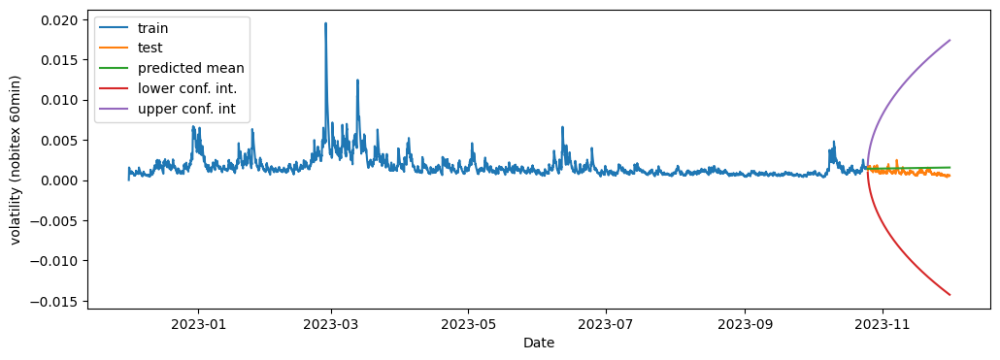

In [171]:
model_fit = fit_arima(ser, order=(2, 1, 0), trend='t', vname=vname, plot_forecast=True)

Not good so far! The lower confidence interval predicts negative values in volatility!

In [172]:
resids = model_fit.resid

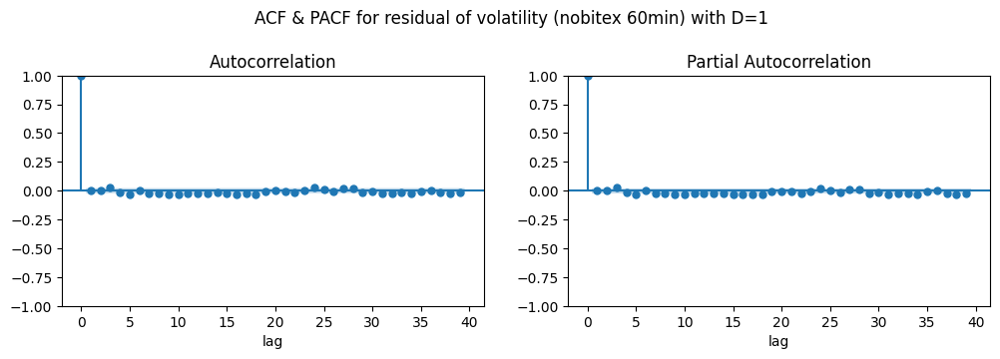

In [173]:
acf_pacf(resids, 'residual of '+vname+' with D=1')

Autocorrelations are eliminated, but the forecast is so inaccurate.

##### ARIMA(0, 2, 1)

What about using D=2 and smoothing by MA(1)?

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7884
Model:                 ARIMA(0, 2, 1)   Log Likelihood               53730.805
Date:                Sun, 11 Aug 2024   AIC                        -107457.610
Time:                        04:06:39   BIC                        -107443.666
Sample:                    12-01-2022   HQIC                       -107452.834
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7241      0.001   -741.062      0.000      -0.726      -0.722
sigma2       6.96e-08   4.54e-11   1533.866      0.000    6.95e-08    6.97e-08
Ljung-Box (L1) (Q):                  79.87   Jarque-

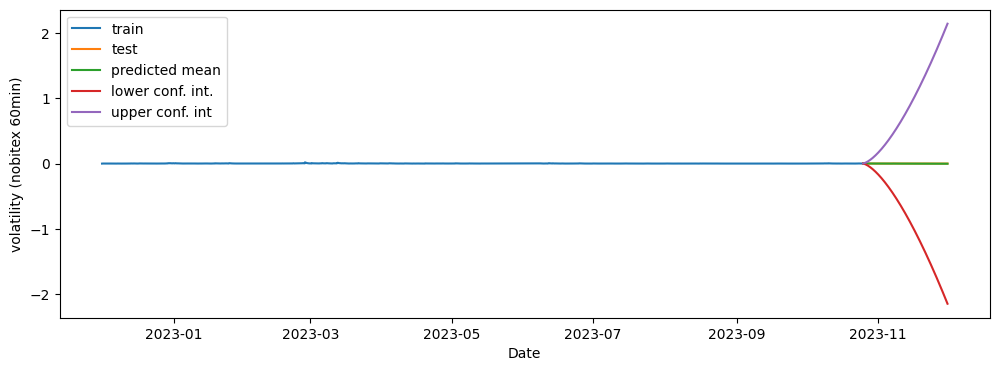

In [174]:
model_fit = fit_arima(ser, order=(0, 2, 1), trend=None, vname=vname, plot_forecast=True)

In [175]:
resids = model_fit.resid

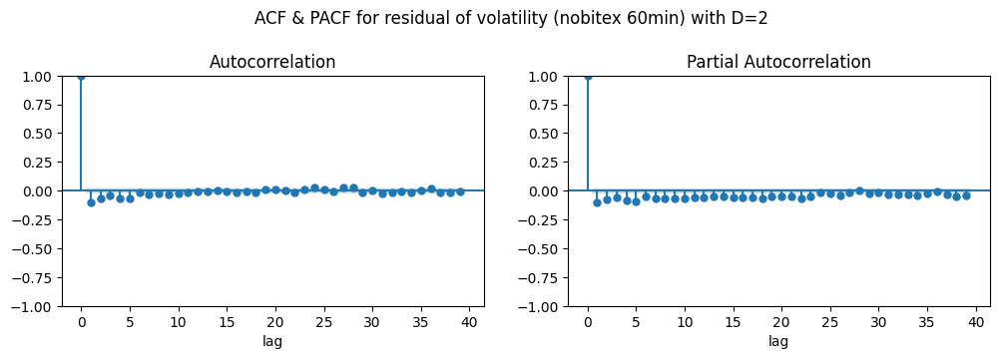

In [176]:
acf_pacf(resids, 'residual of '+vname+' with D=2')

Not only autocorrelations are not cancelled out, but the confidence intervals are ridiculously big!

##### ARIMA for Log(Volatility)

Now I want to take the logarithm of volatility in the hope that **log transformation reduces the change in variane effect**. After all computations, I revert the log transformation by taking exponential of values. Let's see what happens:

In [177]:
logser = ser.apply(np.log).replace(-np.inf, np.nan).dropna()
vname = 'log(volatility) for nobitex 60min'

Look at 1 & 2 orders of differencing the transformed series to determine which one is closer to be stationary:

In [178]:
logserdif1 = logser.diff().dropna()
logserdif2 = logser.diff().diff().dropna()

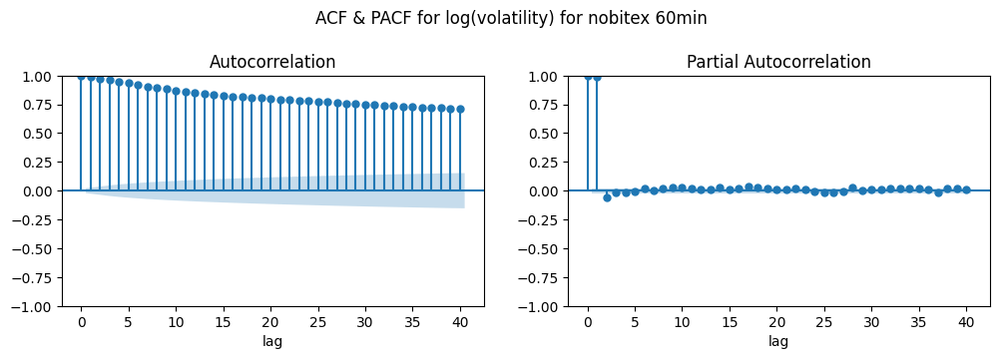

In [179]:
acf_pacf(logser, vname)

In [180]:
check_stationary_adf(logser, vname)


    For this log(volatility) for nobitex 60min series:
        - pvalue of non-stationary NH: 1.0525955081085647e-06
        - test statistic: -5.637928462141212
        - compare with critical values: {'1%': -3.43109850919497, '5%': -2.8618707912826507, '10%': -2.5669460752297355}
        


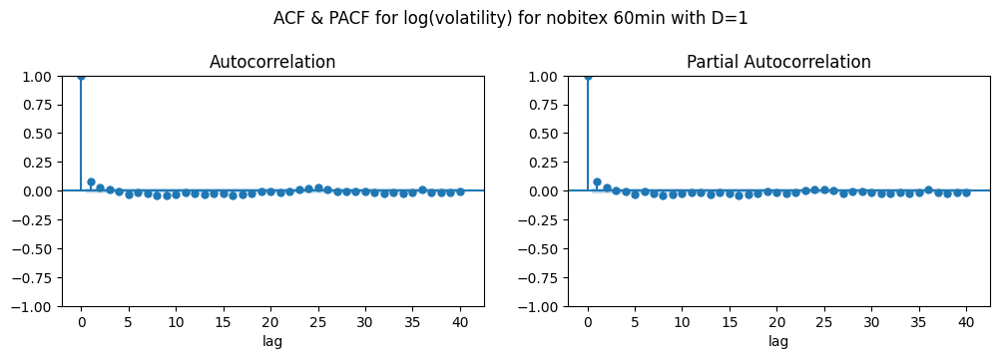

In [181]:
acf_pacf(logserdif1, vname+' with D=1')

In [182]:
check_stationary_adf(logserdif1, vname+' with D=1')


    For this log(volatility) for nobitex 60min with D=1 series:
        - pvalue of non-stationary NH: 0.0
        - test statistic: -19.68392636664194
        - compare with critical values: {'1%': -3.4311002266619637, '5%': -2.861871550193009, '10%': -2.5669464792028873}
        


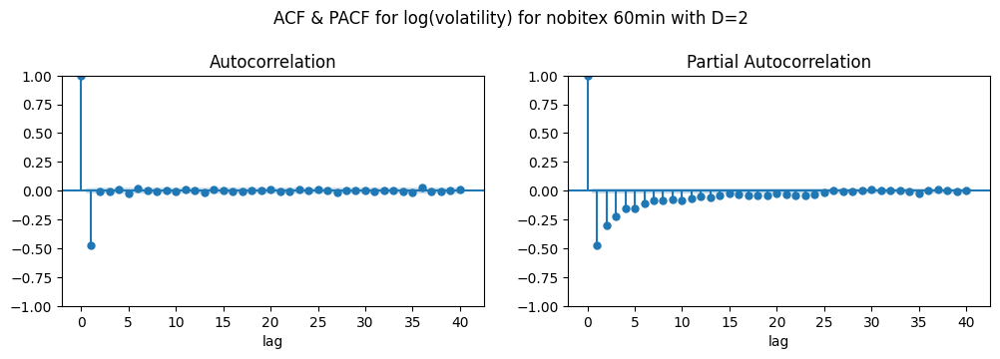

In [183]:
acf_pacf(logserdif2, vname+' with D=2')

In [184]:
check_stationary_adf(logserdif2, vname+' with D=2')


    For this log(volatility) for nobitex 60min with D=2 series:
        - pvalue of non-stationary NH: 0.0
        - test statistic: -26.85467150490017
        - compare with critical values: {'1%': -3.431100312742227, '5%': -2.861871588229946, '10%': -2.56694649945021}
        


Using first order of difference in combination with some order of AR could be reasonable:

In [185]:
idx = int(len(ser) / 10)
ser_train, ser_test = logser.iloc[:-idx], logser.iloc[-idx:]

model = ARIMA(ser_train, order=(4, 1, 0), trend='t')
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                nobitex   No. Observations:                 7883
Model:                 ARIMA(4, 1, 0)   Log Likelihood                7784.908
Date:                Sun, 11 Aug 2024   AIC                         -15557.816
Time:                        04:07:44   BIC                         -15515.982
Sample:                    12-01-2022   HQIC                        -15543.486
                         - 10-25-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             0.0002      0.002      0.123      0.902      -0.003       0.004
ar.L1          0.0848      0.008     10.453      0.000       0.069       0.101
ar.L2          0.0246      0.011      2.268      0.0

In [186]:
forecast_results = model_fit.get_forecast(steps=len(ser_test))
predictions, conf_ints = np.exp(forecast_results.predicted_mean), np.exp(forecast_results.conf_int())

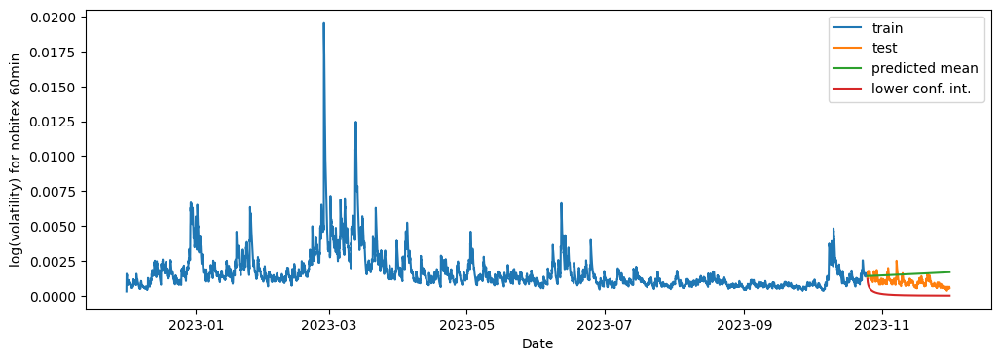

In [189]:
plt.figure(figsize=(12, 4))
plt.plot(np.exp(ser_train), label='train'); plt.plot(np.exp(ser_test), label='test')
plt.plot(predictions, label='predicted mean')
plt.plot(conf_ints.iloc[:, 0], label='lower conf. int.')
# plt.plot(conf_ints.iloc[:, 1], label='upper conf. int')
plt.xlabel('Date'); plt.ylabel(vname)
plt.legend(); plt.show()

The **lower** conf int was acceptable (thanks to exponential function with values greater than zero), but the **upper** was not! It explodes such that I had to remove it from the plot.

##### GARCH models

In [190]:
lrser = 1000 * lrdf['60'].nobitex

Notice the scaling factor (`1000`) in log return series of Nobitex 60 min, to prevent errors in convergence.

In [191]:
split_date = datetime(2023, 10, 25, 13)

lrser_train, lrser_test = lrser[:split_date], lrser[split_date:]

In [192]:
am = arch_model(lrser, mean='Constant', vol='GARCH', p=1, o=0, q=1, power=2, dist='normal')
am_fit = am.fit(last_obs=split_date)
print(am_fit.summary())

Iteration:      1,   Func. Count:      6,   Neg. LLF: 55327.539077355774
Iteration:      2,   Func. Count:     15,   Neg. LLF: 22598.386482933594
Iteration:      3,   Func. Count:     21,   Neg. LLF: 15235.76228150736
Iteration:      4,   Func. Count:     27,   Neg. LLF: 15219.906157568468
Iteration:      5,   Func. Count:     33,   Neg. LLF: 16171.704446159269
Iteration:      6,   Func. Count:     40,   Neg. LLF: 15126.315421347028
Iteration:      7,   Func. Count:     45,   Neg. LLF: 15127.278760816685
Iteration:      8,   Func. Count:     51,   Neg. LLF: 15124.606664099665
Iteration:      9,   Func. Count:     56,   Neg. LLF: 15124.554732247205
Iteration:     10,   Func. Count:     61,   Neg. LLF: 15124.554587721934
Iteration:     11,   Func. Count:     66,   Neg. LLF: 15124.554585467617
Iteration:     12,   Func. Count:     71,   Neg. LLF: 15129.548189657839
Optimization terminated successfully    (Exit mode 0)
            Current function value: 15124.554585467491
            Iter

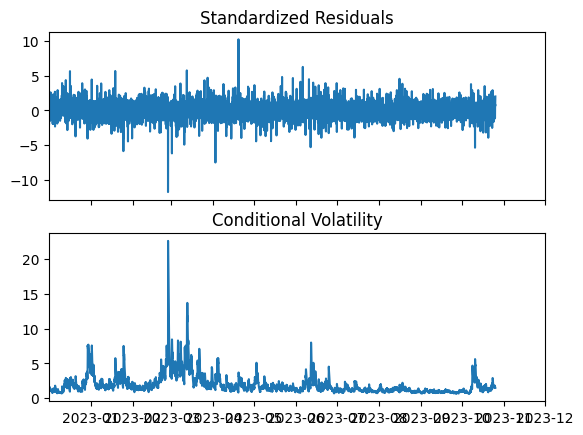

In [193]:
fig = am_fit.plot()

Now let's get the forecasts. I use just 1 horizon because I don't know what is it exactly yet!

In [194]:
forecasts = am_fit.forecast(horizon=1, start=split_date)
predictions = forecasts.variance

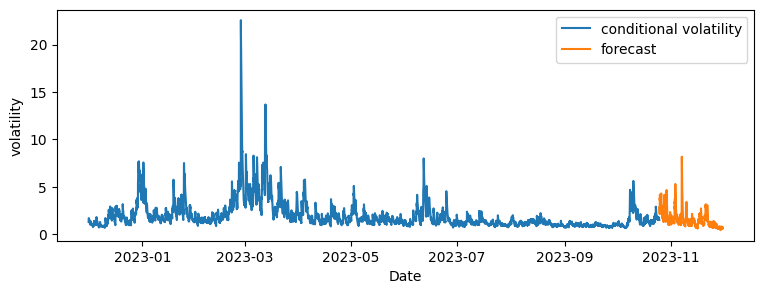

In [195]:
plt.figure(figsize=(9, 3))
plt.plot(am_fit.conditional_volatility, label='conditional volatility')
plt.plot(predictions, label='forecast')
plt.xlabel('Date'); plt.ylabel('volatility')
plt.legend()
plt.show()

## Inter-Market Analysis

In [196]:
lrdf['1'].corr()

,nobitex,tabdeal,implied
nobitex,1.000000,0.027723,0.030432
tabdeal,0.027723,1.000000,0.019654
implied,0.030432,0.019654,1.000000


In [197]:
def corr_matrix(df):
    
    return df.corr()

In [198]:
corrdf = lrdf['1'][:-1].groupby(pd.Grouper(freq='ME')).apply(corr_matrix)
corrdf

nobitex   tabdeal   implied
2022-12-31 nobitex  1.000000  0.027806  0.109261
           tabdeal  0.027806  1.000000  0.020473
           implied  0.109261  0.020473  1.000000
2023-01-31 nobitex  1.000000  0.013029  0.068074
           tabdeal  0.013029  1.000000  0.007546
           implied  0.068074  0.007546  1.000000
2023-02-28 nobitex  1.000000  0.043764  0.044224
           tabdeal  0.043764  1.000000  0.034938
           implied  0.044224  0.034938  1.000000
2023-03-31 nobitex  1.000000  0.043114  0.030840
           tabdeal  0.043114  1.000000  0.016507
           implied  0.030840  0.016507  1.000000
2023-04-30 nobitex  1.000000  0.016064  0.042157
           tabdeal  0.016064  1.000000  0.016030
           implied  0.042157  0.016030  1.000000
2023-05-31 nobitex  1.000000  0.009712  0.029115
           tabdeal  0.009712  1.000000  0.007296
           implied  0.029115  0.007296  1.000000
2023-06-30 nobitex  1.000000  0.009198  0.001985
           tabdeal  0.009198  1.000000  0.011354
           implied  0.001985  0.011354  1.000000
2023-07-31 nobitex  1.000000  0.002773 -0.000043
           tabdeal  0.002773  1.000000  0.016274
           implied -0.000043  0.016274  1.000000
2023-08-31 nobitex  1.000000  0.001936  0.003446
           tabdeal  0.001936  1.000000  0.031910
           implied  0.003446  0.031910  1.000000
2023-09-30 nobitex  1.000000 -0.001194  0.005268
           tabdeal -0.001194  1.000000  0.035754
           implied  0.005268  0.035754  1.000000
2023-10-31 nobitex  1.000000  0.113289  0.017794
           tabdeal  0.113289  1.000000  0.027791
           implied  0.017794  0.027791  1.000000
2023-11-30 nobitex  1.000000  0.065280  0.024352
           tabdeal  0.065280  1.000000  0.074915
           implied  0.024352  0.074915  1.000000

In [199]:
corrdf.loc[(slice(None), 'nobitex'), 'tabdeal'].droplevel(1)

2022-12-31    0.027806
2023-01-31    0.013029
2023-02-28    0.043764
2023-03-31    0.043114
2023-04-30    0.016064
2023-05-31    0.009712
2023-06-30    0.009198
2023-07-31    0.002773
2023-08-31    0.001936
2023-09-30   -0.001194
2023-10-31    0.113289
2023-11-30    0.065280
Freq: ME, Name: tabdeal, dtype: float64

In [200]:
def lagged_cor_matrix(df):

    combined_df = pd.concat([df, df.shift(1)], axis=1)
    combined_df.columns = ['nobitex', 'tabdeal', 'implied', 'lagged_nobitex', 'lagged_tabdeal', 'lagged_implied']
    return combined_df.corr().iloc[:3, -3:]

In [201]:
lagged_cor_matrix(lrdf['1'])

,lagged_nobitex,lagged_tabdeal,lagged_implied
nobitex,-0.371397,0.007625,0.008615
tabdeal,0.025851,-0.043365,0.011369
implied,0.021962,0.015483,-0.287056


In [202]:
lagcorrdf = lrdf['1'][:-1].groupby(pd.Grouper(freq='ME')).apply(lagged_cor_matrix)
lagcorrdf

lagged_nobitex  lagged_tabdeal  lagged_implied
2022-12-31 nobitex       -0.340654        0.001085    4.057735e-02
           tabdeal        0.016412       -0.008277    1.227359e-02
           implied        0.076376        0.015838   -6.453895e-02
2023-01-31 nobitex       -0.345434        0.002445   -6.082131e-04
           tabdeal        0.014509       -0.039858    1.205775e-03
           implied        0.037056        0.014643   -3.851760e-01
2023-02-28 nobitex       -0.254188        0.038159    5.104302e-03
           tabdeal        0.060414       -0.046596    2.304082e-02
           implied        0.019744        0.030841   -3.721969e-01
2023-03-31 nobitex       -0.252345        0.022443    2.135803e-02
           tabdeal        0.037852       -0.072206    1.361956e-02
           implied        0.020234        0.016390   -4.097116e-01
2023-04-30 nobitex       -0.369473        0.006458    1.375581e-02
           tabdeal        0.015890       -0.027704    7.013606e-03
           implied        0.028402       -0.005684   -3.884746e-01
2023-05-31 nobitex       -0.380861        0.004927    1.189584e-03
           tabdeal        0.006729       -0.016303    8.807790e-04
           implied        0.025215       -0.003667   -2.437696e-01
2023-06-30 nobitex       -0.394245       -0.001698    2.971095e-03
           tabdeal       -0.001297       -0.051449    9.578162e-03
           implied        0.006424        0.003070    5.417530e-02
2023-07-31 nobitex       -0.427607       -0.000717    7.626616e-03
           tabdeal        0.005359        0.056032   -1.725201e-03
           implied       -0.003685        0.026748   -1.461303e-01
2023-08-31 nobitex       -0.423985       -0.002744    2.797833e-08
           tabdeal       -0.003351        0.069116    3.227409e-02
           implied        0.009123        0.035649    1.538707e-02
2023-09-30 nobitex       -0.438584       -0.001372    7.460815e-03
           tabdeal        0.002323       -0.027474    1.713748e-02
           implied       -0.011475        0.032690   -4.789311e-02
2023-10-31 nobitex       -0.413294       -0.000713    6.708103e-03
           tabdeal        0.041447       -0.092576    1.223361e-02
           implied        0.011919        0.015015   -1.177122e-01
2023-11-30 nobitex       -0.452604       -0.020526   -3.672804e-03
           tabdeal        0.122599       -0.129360    3.243746e-02
           implied        0.069668        0.053553   -1.204467e-01

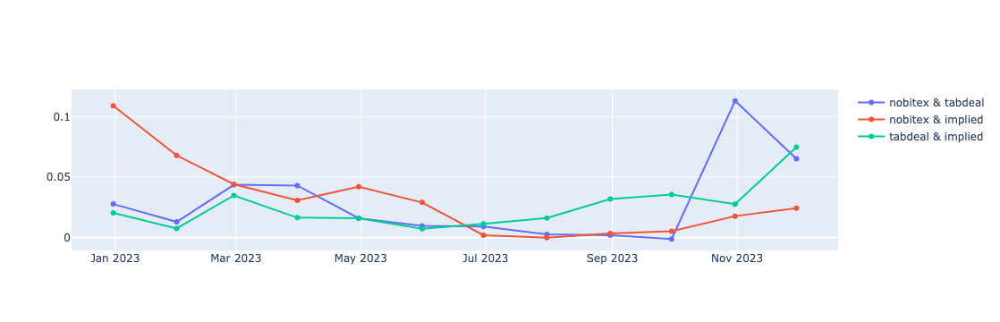

In [203]:
fig = go.Figure()

pairs = [('nobitex', 'tabdeal'), ('nobitex', 'implied'), ('tabdeal', 'implied')]

for p1, p2 in pairs:
    df = corrdf.loc[(slice(None), p1), p2].droplevel(1)
    fig.add_trace(go.Scatter(x=df.index, y=df, name=p1+' & '+p2))

fig.show()

# Resources

I mainly used these resources for learning and practical exercises:

* [Topics in Mathematics with Applications in Finance](https://ocw.mit.edu/courses/18-s096-topics-in-mathematics-with-applications-in-finance-fall-2013/pages/lecture-notes/)

* [Intel Time-Series Analysis](https://www.intel.com/content/www/us/en/developer/topic-technology/artificial-intelligence/training/course-time-series-analysis.html)

* [ARIMA Models for Time Series Forecasting - Duke University](https://people.duke.edu/~rnau/411arim.htm)

* [ARCH Modeling - arch library documentations](https://arch.readthedocs.io/en/latest/univariate/introduction.html)

* As well as ChatGPT for guidance and orientations.